
# limTOD: coordinate-consistent real-beam TOD → NSIDE=8 recovery with priors

This notebook keeps one coordinate convention throughout the simulation and mapmaking.

The convention used here is:

- `GDSM_sky_model` is loaded as a Galactic sky map.
- The sky is explicitly rotated to the analysis frame `ANALYSIS_COORD = 'C'`, i.e. celestial/equatorial coordinates.
- All downstream products use that same analysis frame: raw sky used for TOD, Gaussian-smoothed reference maps, plain degraded reference, mapmaker pixels, recovered maps, residuals, hit maps, and uncertainty maps.

The pipeline is:

1. Load GDSM at NSIDE 32 and 64.
2. Rotate the sky from Galactic to equatorial coordinates.
3. Build NSIDE=8 reference maps in equatorial coordinates.
4. Generate a 24 h Jodrell real-beam TOD from the equatorial NSIDE=32 sky.
5. Build a matched NSIDE=8 mapmaker operator with the same beam normalisation as TOD generation.
6. Run closure tests.
7. Recover maps with no prior, ridge regularisation, absolute-K priors, and relative priors.
8. Compare recovered maps against plain and Gaussian-smoothed references.
9. Plot hit maps, selected-pixel geometry, residuals, and uncertainty maps.

Important interpretation:

- Grey pixels are not recovered sky values. They are pixels not selected into the mapmaker patch.
- The lower/bottom part of recovered maps can be grey because the selected pixel set does not include those pixels.
- For a zenith drift scan from Jodrell, strong coverage is expected in a northern declination band around the site latitude.


## 1. Imports

In [4]:

import os
import re
import glob
from pathlib import Path

import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import healpy as hp
from astropy.io import fits

import limTOD
from limTOD import generate_LSTs_deg, generate_TOD_sky, GDSM_sky_model, HPW_mapmaking
from limTOD.simulator import generate_sky2sys_projection

print("limTOD imported from:", limTOD.__file__)


limTOD imported from: /Users/user/LimTOD/rhino-TODsim/limTOD/__init__.py


## 2. One-place configuration

In [5]:

# ============================================================
# CONFIGURATION: edit here, and only here
# ============================================================

FREQ_MHZ = 70.0

TOD_SKY_NSIDE = 32
PLOT_SKY_NSIDE_LIST = [32, 64]
SIM_NSIDE = 32
MAP_NSIDE = 8

# Coordinate convention.
# PyGDSM/GDSM maps are treated as Galactic. limTOD pointing is celestial/equatorial.
# Therefore we rotate sky maps G -> C before TOD generation and before truth-map construction.
SKY_INPUT_COORD = "G"      # Galactic sky returned by GDSM/pygdsm
ANALYSIS_COORD = "C"       # Celestial/equatorial frame used by limTOD pointing

FWHM_DEG_LIST = [10.0, 20.0, 40.0]
REFERENCE_FOR_PRIOR = 40.0

# Pick the beam set intentionally. The notebook prints the chosen FITS file.
BEAM_DIR = Path("~/LimTOD/rhino-TODsim/data/DipoleDry").expanduser()
# BEAM_DIR = Path("~/LimTOD/rhino-TODsim/data/HornDry").expanduser()
# BEAM_DIR = Path("~/LimTOD/rhino-TODsim/data/HornWet").expanduser()

ANT_LAT_DEG = 53.2421
ANT_LON_DEG = -2.3067
ANT_HEIGHT_M = 100.0
START_TIME_UTC = "2019-04-23 20:41:56.397"

OBS_HOURS = 24.0
DT_SECONDS = 60.0
N_TIME = int(round(OBS_HOURS * 3600.0 / DT_SECONDS))
AZIMUTH_DEG = 0.0
ELEVATION_DEG = 90.0
ROTATION_PERIOD_HOURS = 1.0

# Keep TOD generation and operator construction matched.
NORMALIZE_BEAM = True
THRESHOLD_SELECT_PIX = 0.05
BEAM_TRUNCATE_FRAC = 0.05

# Solver settings.
NOISE_VARIANCE = 1.0
REG_WEAK = 1e-8       # nearly unregularised; useful for seeing weak modes
REG_RIDGE = 1e-4      # stable no-prior baseline

# Prior settings.
ABSOLUTE_SIGMA_K_LIST = [5000.0, 2000.0, 1000.0, 500.0, 200.0, 100.0]
RELATIVE_SIGMA_FRAC_LIST = [0.5, 0.3]
RELATIVE_SIGMA_FLOOR_K = 300.0

WEIGHTED_HIT_CUTS = [0.0, 0.2, 0.5, 1.0, 2.0]
PLOT_HIT_CUT = 1.0

print("Configuration summary")
for name in [
    "FREQ_MHZ", "TOD_SKY_NSIDE", "SIM_NSIDE", "MAP_NSIDE", "SKY_INPUT_COORD", "ANALYSIS_COORD",
    "BEAM_DIR", "N_TIME", "DT_SECONDS", "NORMALIZE_BEAM", "THRESHOLD_SELECT_PIX", "BEAM_TRUNCATE_FRAC",
    "REG_WEAK", "REG_RIDGE"
]:
    print(f"  {name} =", globals()[name])


Configuration summary
  FREQ_MHZ = 70.0
  TOD_SKY_NSIDE = 32
  SIM_NSIDE = 32
  MAP_NSIDE = 8
  SKY_INPUT_COORD = G
  ANALYSIS_COORD = C
  BEAM_DIR = /Users/user/LimTOD/rhino-TODsim/data/DipoleDry
  N_TIME = 1440
  DT_SECONDS = 60.0
  NORMALIZE_BEAM = True
  THRESHOLD_SELECT_PIX = 0.05
  BEAM_TRUNCATE_FRAC = 0.05
  REG_WEAK = 1e-08
  REG_RIDGE = 0.0001


## 3. Helper functions

In [6]:

# ============================================================
# HELPER FUNCTIONS
# ============================================================

def as_finite_array(x, clip_negative=False):
    arr = np.nan_to_num(np.asarray(x, dtype=float), nan=0.0, posinf=0.0, neginf=0.0)
    if clip_negative:
        arr = np.where(arr < 0.0, 0.0, arr)
    return arr


def get_nside(x):
    return hp.npix2nside(len(np.asarray(x).reshape(-1)))


def finite_percentile(values, q, fallback=0.0):
    values = np.asarray(values, dtype=float)
    values = values[np.isfinite(values)]
    if values.size == 0:
        return fallback
    return float(np.percentile(values, q))


def print_percentiles(name, x):
    x = np.asarray(x, dtype=float)
    p = np.nanpercentile(x, [0, 1, 5, 50, 95, 99, 100])
    print(f"{name:34s}: min/p1/p5/med/p95/p99/max = " + " / ".join(f"{v:.4g}" for v in p))


def plot_map(m, title, unit="K", vmin=None, vmax=None, cmap="viridis", badcolor="gray"):
    hp.mollview(m, title=title, unit=unit, min=vmin, max=vmax, cmap=cmap, badcolor=badcolor)
    hp.graticule()
    plt.show()


def patch_to_full(patch, pix, nside, unseen=hp.UNSEEN):
    full = np.full(hp.nside2npix(nside), unseen, dtype=float)
    full[np.asarray(pix, dtype=int)] = np.asarray(patch, dtype=float).reshape(-1)
    return full


def full_to_patch(full_map, pix):
    return np.asarray(full_map, dtype=float).reshape(-1)[np.asarray(pix, dtype=int)]


def rotate_healpix_coord(map_in, coord_in=SKY_INPUT_COORD, coord_out=ANALYSIS_COORD):
    """
    Rotate a scalar HEALPix map between coordinate frames using healpy.

    coord_in/coord_out use healpy labels:
      'G' = Galactic
      'C' = Celestial/equatorial
      'E' = Ecliptic
    """
    map_in = np.asarray(map_in, dtype=float).reshape(-1)
    if coord_in == coord_out:
        return map_in.copy()
    rot = hp.Rotator(coord=[coord_in, coord_out])
    return as_finite_array(rot.rotate_map_pixel(map_in))


def load_gdsm_raw(freq_mhz, nside, clip_negative=False):
    """Load the GDSM sky in its native/input coordinate convention."""
    sky = GDSM_sky_model(freq=freq_mhz, nside=nside)
    return as_finite_array(sky, clip_negative=clip_negative)


def load_gdsm_analysis_coord(freq_mhz, nside, clip_negative=False):
    """Load GDSM and rotate it into the coordinate frame used by limTOD pointing."""
    sky_input = load_gdsm_raw(freq_mhz, nside, clip_negative=clip_negative)
    sky_analysis = rotate_healpix_coord(sky_input, coord_in=SKY_INPUT_COORD, coord_out=ANALYSIS_COORD)
    return as_finite_array(sky_analysis, clip_negative=clip_negative)


def simple_degrade_sky(sky, nside_out):
    return as_finite_array(hp.ud_grade(sky, nside_out=nside_out))


def gaussian_degrade_truth_from_sky(sky_source, nside_out, fwhm_deg):
    smoothed = hp.smoothing(np.asarray(sky_source, dtype=float), fwhm=np.radians(fwhm_deg), verbose=False)
    smoothed = as_finite_array(smoothed)
    truth = as_finite_array(hp.ud_grade(smoothed, nside_out=nside_out))
    return smoothed, truth


def find_beam_file(beam_dir, freq_mhz):
    beam_dir = Path(beam_dir).expanduser()
    if not beam_dir.exists():
        raise FileNotFoundError(f"Beam directory does not exist: {beam_dir}")
    fits_files = sorted(glob.glob(str(beam_dir / "*.fits"))) + sorted(glob.glob(str(beam_dir / "*.FITS")))
    if not fits_files:
        raise FileNotFoundError(f"No FITS files found in {beam_dir}")
    target = f"{freq_mhz:.1f}"
    candidates = [f for f in fits_files if target in Path(f).name]
    if len(candidates) == 0:
        target_int = str(int(round(freq_mhz)))
        candidates = [f for f in fits_files if target_int in Path(f).name]
    chosen = candidates[0] if candidates else fits_files[0]
    print("Chosen beam file:", chosen)
    return Path(chosen)


def load_healpix_beam_from_fits(path, target_nside=None):
    data = fits.getdata(path)
    data = np.asarray(data, dtype=float)
    if data.ndim == 1:
        beam = data
    elif data.ndim == 2:
        valid_rows = False
        valid_cols = False
        try:
            hp.npix2nside(data.shape[0]); valid_rows = True
        except Exception:
            pass
        try:
            hp.npix2nside(data.shape[1]); valid_cols = True
        except Exception:
            pass
        if valid_cols:
            beam = data[0]
        elif valid_rows:
            beam = data[:, 0]
        else:
            beam = data.reshape(-1)
    else:
        beam = data.reshape(-1)

    beam = as_finite_array(beam)
    if np.nanmax(np.abs(beam)) <= 0:
        raise ValueError("Beam has non-positive/zero peak.")
    beam = np.where(beam < 0.0, 0.0, beam)
    beam = beam / np.nanmax(beam)

    nside_in = hp.get_nside(beam)
    if target_nside is not None and target_nside != nside_in:
        beam = hp.ud_grade(beam, nside_out=target_nside)
        beam = as_finite_array(beam)
        beam = np.where(beam < 0.0, 0.0, beam)
        beam = beam / np.nanmax(beam)
    return beam


def make_time_and_pointing():
    time_s = np.arange(N_TIME, dtype=float) * DT_SECONDS
    time_h = time_s / 3600.0
    LST_deg_list = generate_LSTs_deg(ANT_LAT_DEG, ANT_LON_DEG, ANT_HEIGHT_M, time_s, start_time_utc=START_TIME_UTC)
    azimuth_deg_list = np.full(N_TIME, AZIMUTH_DEG, dtype=float)
    elevation_deg_list = np.full(N_TIME, ELEVATION_DEG, dtype=float)
    rotation_period_s = ROTATION_PERIOD_HOURS * 3600.0
    selfrot_deg_list = (time_s / rotation_period_s * 360.0) % 360.0
    return time_s, time_h, LST_deg_list, azimuth_deg_list, elevation_deg_list, selfrot_deg_list


def build_mapper_with_matched_operator(beam_map, LST_deg, az_deg, el_deg, selfrot_deg):
    mapper = HPW_mapmaking(
        beam_map=beam_map,
        LST_deg_list_group=LST_deg,
        lat_deg=ANT_LAT_DEG,
        azimuth_deg_list_group=az_deg,
        elevation_deg_list_group=el_deg,
        selfrot_deg_list_group=selfrot_deg,
        threshold=THRESHOLD_SELECT_PIX,
        nside_hires=SIM_NSIDE,
        nside_target=MAP_NSIDE,
        beam_truncate_frac_thres=BEAM_TRUNCATE_FRAC,
    )
    matched_A = generate_sky2sys_projection(
        beam_map=beam_map,
        LST_deg_list=LST_deg,
        lat_deg=ANT_LAT_DEG,
        azimuth_deg_list=az_deg,
        elevation_deg_list=el_deg,
        selfrot_deg_list=selfrot_deg,
        pixel_indices=mapper.pixel_indices,
        nside_hires=SIM_NSIDE,
        nside_target=MAP_NSIDE,
        normalize_beam=NORMALIZE_BEAM,
        truncate_frac_thres=BEAM_TRUNCATE_FRAC,
    )
    mapper.Tsys_operators = matched_A
    return mapper


def compute_hitmap_from_operator(A):
    A = np.asarray(A, dtype=float)
    hits = np.sum(np.abs(A) > 0.0, axis=0)
    weighted_hits = np.sum(np.abs(A), axis=0)
    return hits, weighted_hits


def map_metrics(recovered, truth, weighted_hit=None, cut=0.0):
    recovered = np.asarray(recovered, dtype=float).reshape(-1)
    truth = np.asarray(truth, dtype=float).reshape(-1)
    good = np.isfinite(recovered) & np.isfinite(truth)
    if weighted_hit is not None:
        weighted_hit = np.asarray(weighted_hit, dtype=float).reshape(-1)
        good &= np.isfinite(weighted_hit) & (weighted_hit > cut)
    if good.sum() < 3:
        return dict(n_pix=int(good.sum()), rmse=np.nan, bias=np.nan, std=np.nan, corr=np.nan)
    residual = recovered[good] - truth[good]
    corr = np.corrcoef(truth[good], recovered[good])[0, 1]
    return dict(n_pix=int(good.sum()), rmse=float(np.sqrt(np.mean(residual**2))), bias=float(np.mean(residual)), std=float(np.std(residual)), corr=float(corr))


def plot_four_panel(truth_patch, recovered_patch, hit_patch, pix, title, nside=MAP_NSIDE, hit_label="samples"):
    truth_patch = np.asarray(truth_patch, dtype=float).reshape(-1)
    recovered_patch = np.asarray(recovered_patch, dtype=float).reshape(-1)
    residual_patch = recovered_patch - truth_patch
    truth_full = patch_to_full(truth_patch, pix, nside)
    rec_full = patch_to_full(recovered_patch, pix, nside)
    res_full = patch_to_full(residual_patch, pix, nside)
    hit_full = patch_to_full(hit_patch, pix, nside)
    vmin = finite_percentile(truth_patch, 1)
    vmax = finite_percentile(truth_patch, 99)
    rmax = finite_percentile(np.abs(residual_patch), 95, fallback=1.0)
    plt.figure(figsize=(15, 9))
    hp.mollview(truth_full, title=f"{title}: truth", unit="K", min=vmin, max=vmax, sub=(2, 2, 1), badcolor="gray"); hp.graticule()
    hp.mollview(rec_full, title=f"{title}: recovered", unit="K", min=vmin, max=vmax, sub=(2, 2, 2), badcolor="gray"); hp.graticule()
    hp.mollview(res_full, title=f"{title}: recovered - truth", unit="K", min=-rmax, max=rmax, cmap="coolwarm", sub=(2, 2, 3), badcolor="gray"); hp.graticule()
    hp.mollview(hit_full, title=f"{title}: weighted hit", unit=hit_label, sub=(2, 2, 4), badcolor="gray"); hp.graticule()
    plt.show()


def plot_scatter_and_hit(recovered, truth, weighted_hit, title, hit_cut=PLOT_HIT_CUT):
    recovered = np.asarray(recovered, dtype=float).reshape(-1)
    truth = np.asarray(truth, dtype=float).reshape(-1)
    weighted_hit = np.asarray(weighted_hit, dtype=float).reshape(-1)
    residual = recovered - truth
    good = np.isfinite(recovered) & np.isfinite(truth) & np.isfinite(weighted_hit) & (weighted_hit > hit_cut)
    plt.figure(figsize=(6, 6))
    plt.scatter(truth[good], recovered[good], s=18, alpha=0.7)
    lo = np.nanmin([np.nanmin(truth[good]), np.nanmin(recovered[good])])
    hi = np.nanmax([np.nanmax(truth[good]), np.nanmax(recovered[good])])
    plt.plot([lo, hi], [lo, hi], "k--", lw=1)
    plt.xlabel("Reference truth [K]"); plt.ylabel("Recovered [K]")
    plt.title(f"{title}: recovered vs truth, weighted_hit > {hit_cut}")
    plt.grid(alpha=0.3); plt.show()
    plt.figure(figsize=(7, 5))
    plt.scatter(weighted_hit, residual, s=18, alpha=0.7)
    plt.axhline(0.0, color="k", ls="--", lw=1)
    plt.xlabel("Weighted hit = sum(|A|)"); plt.ylabel("Residual [K]")
    plt.title(f"{title}: residual vs weighted hit")
    plt.grid(alpha=0.3); plt.show()


## 4. Load sky maps and rotate them into the limTOD pointing frame

NSIDE=32
  Input-frame sky (G) min/mean/max = -2736.162 / 2757.634 / 73141.648 K
  Analysis-frame sky (C) min/mean/max = -1220.801 / 2757.866 / 41439.438 K
  Negative pixels in analysis sky: 1 / 12288
NSIDE=64
  Input-frame sky (G) min/mean/max = -9922.873 / 2757.634 / 192826.422 K
  Analysis-frame sky (C) min/mean/max = -3789.043 / 2757.122 / 91622.443 K
  Negative pixels in analysis sky: 4 / 49152


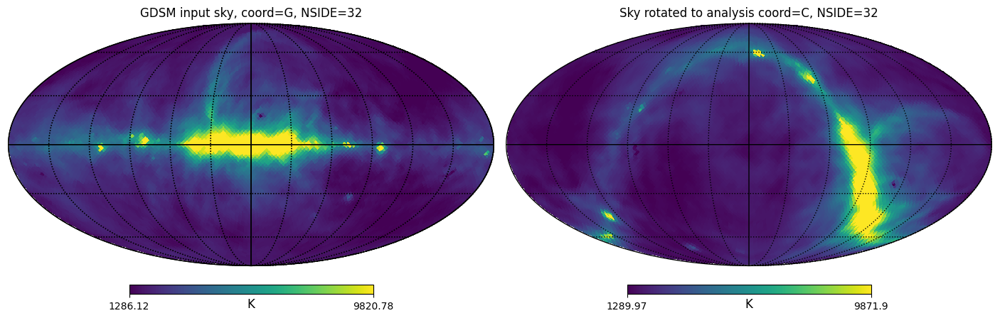

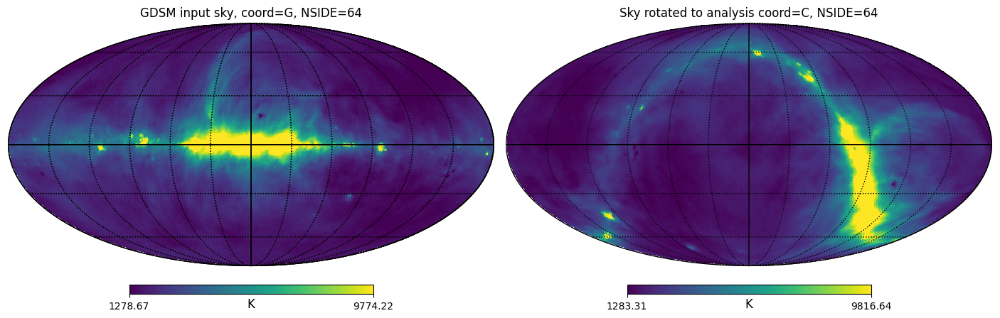

In [7]:

# ============================================================
# Load sky maps in two frames:
#   raw_input_skies: GDSM-native/input frame, treated as Galactic
#   analysis_skies: rotated into celestial/equatorial frame used by limTOD pointing
# ============================================================

raw_input_skies = {}
analysis_skies = {}

for nside in PLOT_SKY_NSIDE_LIST:
    sky_input = load_gdsm_raw(FREQ_MHZ, nside, clip_negative=False)
    sky_analysis = rotate_healpix_coord(sky_input, coord_in=SKY_INPUT_COORD, coord_out=ANALYSIS_COORD)

    raw_input_skies[nside] = sky_input
    analysis_skies[nside] = sky_analysis

    print(f"NSIDE={nside}")
    print(f"  Input-frame sky ({SKY_INPUT_COORD}) min/mean/max = {sky_input.min():.3f} / {sky_input.mean():.3f} / {sky_input.max():.3f} K")
    print(f"  Analysis-frame sky ({ANALYSIS_COORD}) min/mean/max = {sky_analysis.min():.3f} / {sky_analysis.mean():.3f} / {sky_analysis.max():.3f} K")
    print(f"  Negative pixels in analysis sky: {np.sum(sky_analysis < 0)} / {sky_analysis.size}")

# This is the actual sky used later for TOD generation and truth-map construction.
sky_nside32 = analysis_skies[TOD_SKY_NSIDE]

# Visual check: show the native/input sky and the rotated analysis-frame sky.
for nside in PLOT_SKY_NSIDE_LIST:
    sky_input = raw_input_skies[nside]
    sky_analysis = analysis_skies[nside]
    plt.figure(figsize=(14, 5))
    hp.mollview(
        sky_input,
        title=f"GDSM input sky, coord={SKY_INPUT_COORD}, NSIDE={nside}",
        unit="K",
        min=finite_percentile(sky_input, 2),
        max=finite_percentile(sky_input, 98),
        sub=(1, 2, 1),
        badcolor="gray",
    )
    hp.graticule()
    hp.mollview(
        sky_analysis,
        title=f"Sky rotated to analysis coord={ANALYSIS_COORD}, NSIDE={nside}",
        unit="K",
        min=finite_percentile(sky_analysis, 2),
        max=finite_percentile(sky_analysis, 98),
        sub=(1, 2, 2),
        badcolor="gray",
    )
    hp.graticule()
    plt.show()

if np.any(sky_nside32 < 0):
    print("WARNING: analysis-frame NSIDE=32 sky contains negative pixels. We do not clip them by default, but this should be checked before physical interpretation.")


## 5. Build NSIDE=8 reference maps in the same analysis coordinate frame

plain NSIDE32->8                  : min/p1/p5/med/p95/p99/max = 1182 / 1274 / 1399 / 2140 / 6210 / 1.169e+04 / 2.021e+04

Gaussian reference FWHM=10 deg in coord=C
truth NSIDE8                      : min/p1/p5/med/p95/p99/max = 1232 / 1301 / 1416 / 2172 / 6317 / 1.091e+04 / 1.489e+04

Gaussian reference FWHM=20 deg in coord=C
truth NSIDE8                      : min/p1/p5/med/p95/p99/max = 1320 / 1356 / 1462 / 2212 / 6421 / 9458 / 1.078e+04

Gaussian reference FWHM=40 deg in coord=C
truth NSIDE8                      : min/p1/p5/med/p95/p99/max = 1487 / 1520 / 1599 / 2330 / 5752 / 6966 / 7329


/var/folders/y0/4z9tprvs2qb6qwgklyjc_tbw0000gp/T/ipykernel_91854/2693614985.py:80: HealpyDeprecationWarning: "verbose" was deprecated in version 1.15.0 and will be removed in a future version. 
  smoothed = hp.smoothing(np.asarray(sky_source, dtype=float), fwhm=np.radians(fwhm_deg), verbose=False)


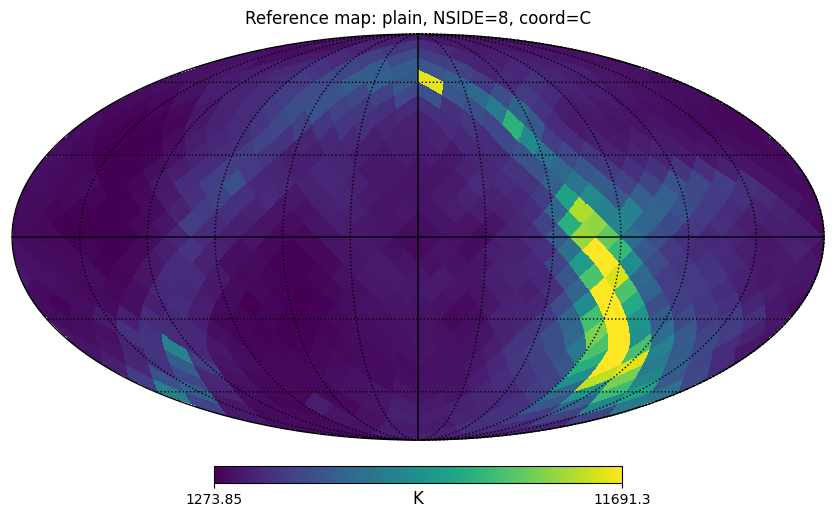

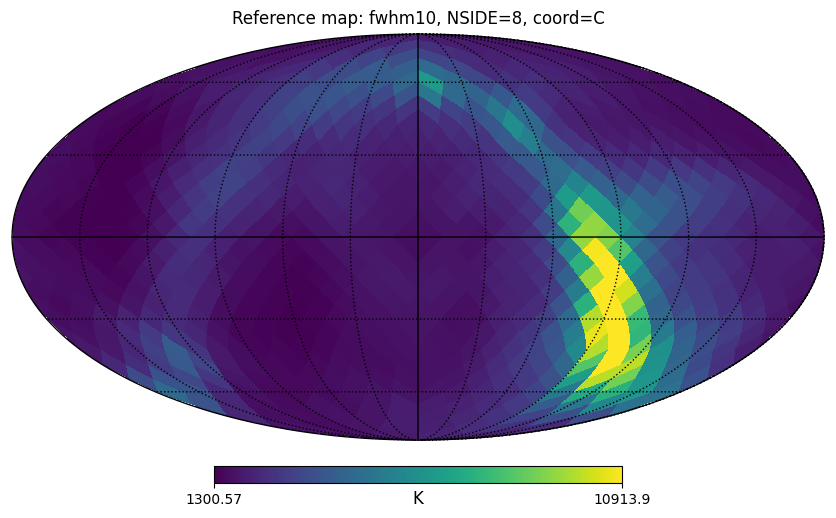

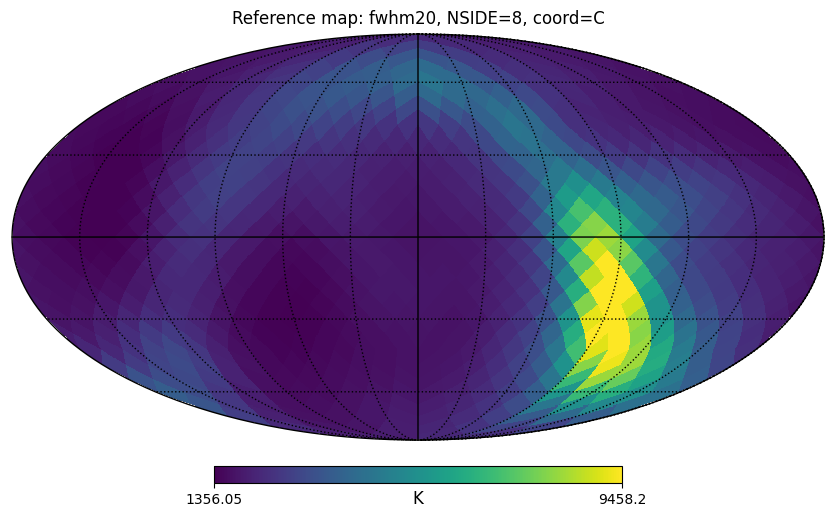

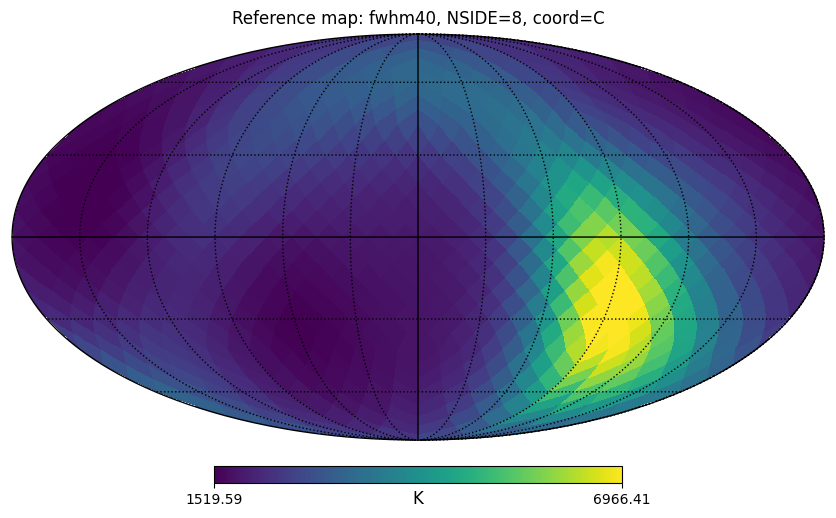

In [8]:

# All reference maps below are built from sky_nside32, which has already been rotated into ANALYSIS_COORD.
reference_maps_full = {}
reference_maps_full["plain"] = simple_degrade_sky(sky_nside32, MAP_NSIDE)
print_percentiles("plain NSIDE32->8", reference_maps_full["plain"])

smoothed_nside32_maps = {}
for fwhm_deg in FWHM_DEG_LIST:
    smoothed32, truth8 = gaussian_degrade_truth_from_sky(sky_nside32, MAP_NSIDE, fwhm_deg)
    smoothed_nside32_maps[fwhm_deg] = smoothed32
    reference_maps_full[f"fwhm{int(fwhm_deg)}"] = truth8
    print(f"\nGaussian reference FWHM={fwhm_deg:.0f} deg in coord={ANALYSIS_COORD}")
    print_percentiles("truth NSIDE8", truth8)

for key, m in reference_maps_full.items():
    plot_map(
        m,
        title=f"Reference map: {key}, NSIDE={MAP_NSIDE}, coord={ANALYSIS_COORD}",
        unit="K",
        vmin=finite_percentile(m, 1),
        vmax=finite_percentile(m, 99),
    )


## 6. Build 24 h Jodrell pointing and self-rotation

N_TIME             = 1440
Observation length = 24.000 h
Samples/rotation   = 60.0
LST range          = 0.073 to 359.823 deg
Self-rot range     = 0.000 to 354.000 deg
Zenith declination at Jodrell is approximately site latitude: Dec ≈ 53.24 deg
This track is in the same analysis frame used for the sky maps: coord=C


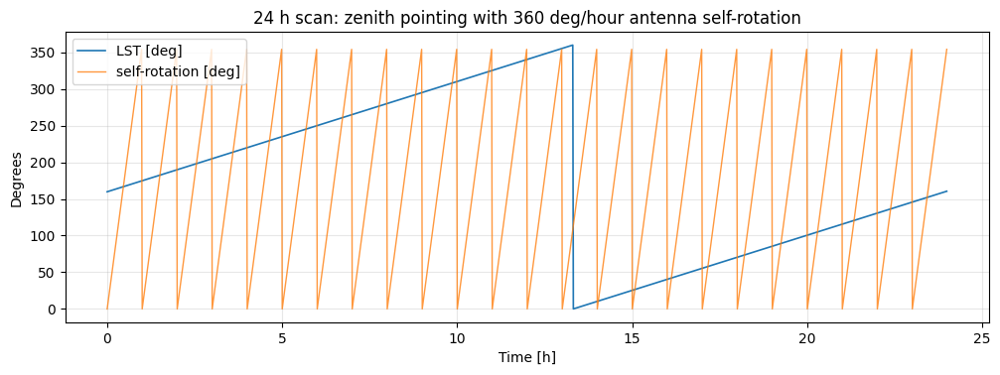

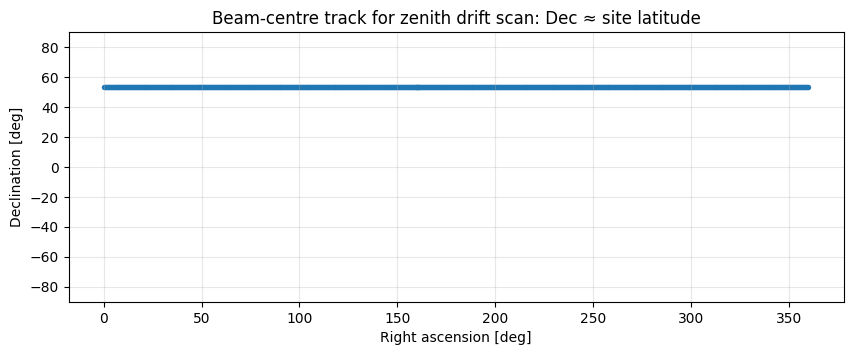

In [9]:

time_s, time_h, LST_deg_list, azimuth_deg_list, elevation_deg_list, selfrot_deg_list = make_time_and_pointing()
print(f"N_TIME             = {N_TIME}")
print(f"Observation length = {time_h[-1] + DT_SECONDS/3600.0:.3f} h")
print(f"Samples/rotation   = {ROTATION_PERIOD_HOURS * 3600.0 / DT_SECONDS:.1f}")
print(f"LST range          = {LST_deg_list.min():.3f} to {LST_deg_list.max():.3f} deg")
print(f"Self-rot range     = {selfrot_deg_list.min():.3f} to {selfrot_deg_list.max():.3f} deg")
print(f"Zenith declination at Jodrell is approximately site latitude: Dec ≈ {ANT_LAT_DEG:.2f} deg")
print(f"This track is in the same analysis frame used for the sky maps: coord={ANALYSIS_COORD}")

fig, ax = plt.subplots(figsize=(12, 3.8))
ax.plot(time_h, LST_deg_list, label="LST [deg]", lw=1.2)
ax.plot(time_h, selfrot_deg_list, label="self-rotation [deg]", lw=1.0, alpha=0.8)
ax.set_xlabel("Time [h]"); ax.set_ylabel("Degrees")
ax.set_title("24 h scan: zenith pointing with 360 deg/hour antenna self-rotation")
ax.legend(); ax.grid(alpha=0.3); plt.show()

ra_track = LST_deg_list
Dec_track = np.full_like(ra_track, ANT_LAT_DEG)
plt.figure(figsize=(10, 3.5))
plt.scatter(ra_track, Dec_track, s=8, alpha=0.7)
plt.xlabel("Right ascension [deg]"); plt.ylabel("Declination [deg]")
plt.title("Beam-centre track for zenith drift scan: Dec ≈ site latitude")
plt.ylim(-90, 90); plt.grid(alpha=0.3); plt.show()


## 7. Load real beam

Chosen beam file: /Users/user/LimTOD/rhino-TODsim/data/DipoleDry/DipoleDry70.0.fits
Beam NSIDE = 32
Beam peak  = 1
Beam min   = 0.00185473
Beam sum   = 2008.27 before per-pointing normalisation
If NORMALIZE_BEAM=True, each pointed/truncated beam is re-normalised to sum=1 inside TOD and operator construction.


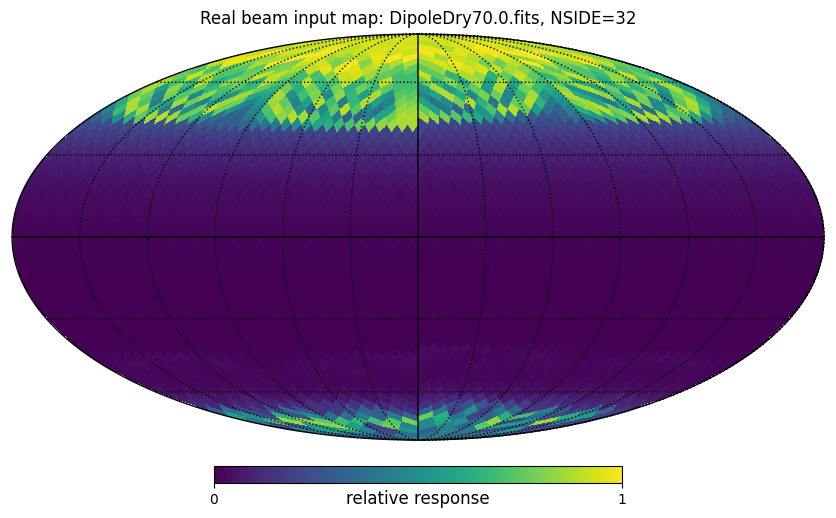

In [10]:

beam_file = find_beam_file(BEAM_DIR, FREQ_MHZ)
real_beam = load_healpix_beam_from_fits(beam_file, target_nside=SIM_NSIDE)
print(f"Beam NSIDE = {get_nside(real_beam)}")
print(f"Beam peak  = {np.nanmax(real_beam):.6g}")
print(f"Beam min   = {np.nanmin(real_beam):.6g}")
print(f"Beam sum   = {np.nansum(real_beam):.6g} before per-pointing normalisation")
print("If NORMALIZE_BEAM=True, each pointed/truncated beam is re-normalised to sum=1 inside TOD and operator construction.")
plot_map(real_beam, title=f"Real beam input map: {beam_file.name}, NSIDE={SIM_NSIDE}", unit="relative response", vmin=0, vmax=1)


## 8. Build matched mapmaker operator


Step 1: Generating the stacked abs(beam) map ... 



100%|██████████| 1440/1440 [00:01<00:00, 1240.39it/s]



Step 2: Selecting pixels above threshold sensitivity ... 

Number of data points: 1440
Number of selected pixels: 768


100%|██████████| 1440/1440 [00:01<00:00, 1302.80it/s]


Number of data points: 1440
Number of selected pixels: 768


100%|██████████| 1440/1440 [00:01<00:00, 1328.46it/s]


MAP_NSIDE total pixels       = 768
Solved pixels                = 768
A shape                      = (1440, 768)
Row sums min/med/max         = 1 / 1 / 1
Hits min/med/max             = 1 / 424.0 / 1440
Weighted hits min/med/max    = 0.000428765 / 1.12357 / 7.94567
Singular values max/min      = 1.97074 / 0.000274232
Condition number             = 7186.41
Numerical rank               = 768 / 768


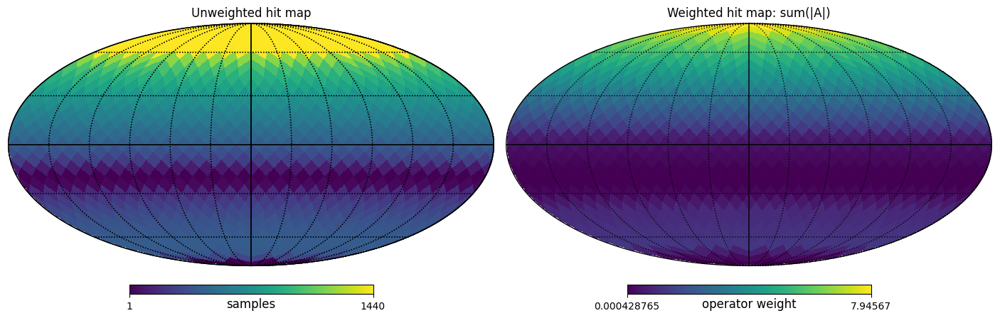

Reference patch keys: ['plain', 'fwhm10', 'fwhm20', 'fwhm40']
plain patch                       : min/p1/p5/med/p95/p99/max = 1182 / 1274 / 1399 / 2140 / 6210 / 1.169e+04 / 2.021e+04
fwhm10 patch                      : min/p1/p5/med/p95/p99/max = 1232 / 1301 / 1416 / 2172 / 6317 / 1.091e+04 / 1.489e+04
fwhm20 patch                      : min/p1/p5/med/p95/p99/max = 1320 / 1356 / 1462 / 2212 / 6421 / 9458 / 1.078e+04
fwhm40 patch                      : min/p1/p5/med/p95/p99/max = 1487 / 1520 / 1599 / 2330 / 5752 / 6966 / 7329

Selected-pixel geometry in analysis coordinates
  selected RA range  = 0.00 to 354.38 deg
  selected Dec range = -84.15 to 84.15 deg
  selected Dec percentiles [0,5,50,95,100] = [-84.14973294 -66.44353569   0.          66.44353569  84.14973294]
  Jodrell zenith Dec ≈ 53.24 deg
  Grey regions in recovered maps are pixels not in this selected mapmaker patch.


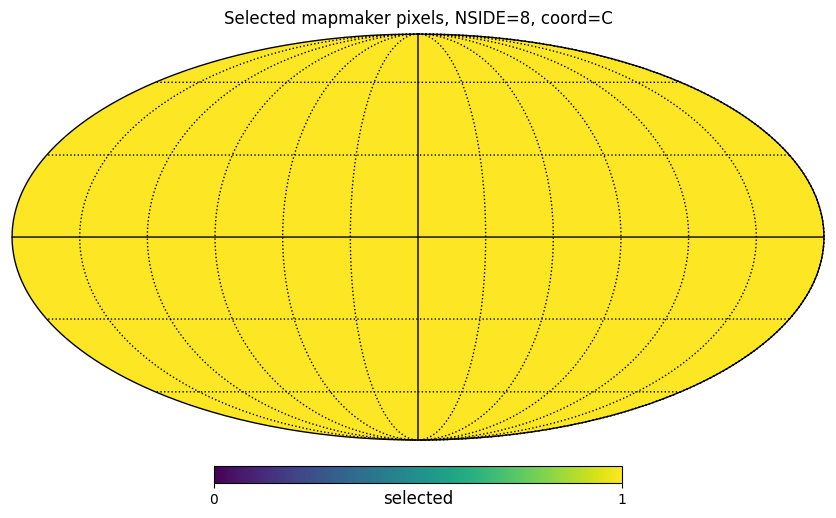

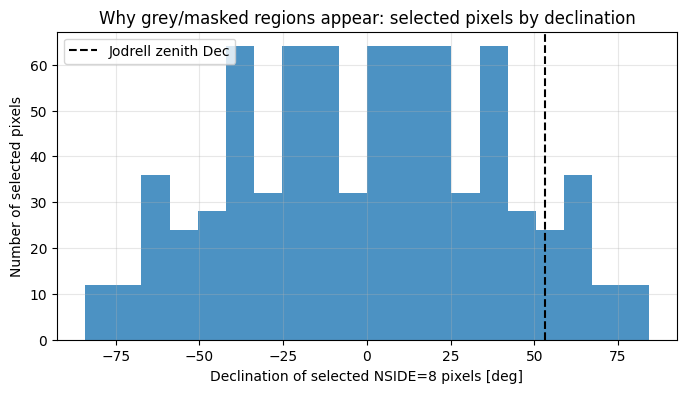

In [11]:

mapper = build_mapper_with_matched_operator(real_beam, LST_deg_list, azimuth_deg_list, elevation_deg_list, selfrot_deg_list)
pix = np.asarray(mapper.pixel_indices, dtype=int)
A = np.asarray(mapper.Tsys_operators, dtype=float)
hits_patch, weighted_hits_patch = compute_hitmap_from_operator(A)

print(f"MAP_NSIDE total pixels       = {hp.nside2npix(MAP_NSIDE)}")
print(f"Solved pixels                = {len(pix)}")
print(f"A shape                      = {A.shape}")
print(f"Row sums min/med/max         = {A.sum(axis=1).min():.6g} / {np.median(A.sum(axis=1)):.6g} / {A.sum(axis=1).max():.6g}")
print(f"Hits min/med/max             = {hits_patch.min()} / {np.median(hits_patch):.1f} / {hits_patch.max()}")
print(f"Weighted hits min/med/max    = {weighted_hits_patch.min():.6g} / {np.median(weighted_hits_patch):.6g} / {weighted_hits_patch.max():.6g}")
s = np.linalg.svd(A, compute_uv=False)
print(f"Singular values max/min      = {s[0]:.6g} / {s[-1]:.6g}")
print(f"Condition number             = {s[0] / s[-1]:.6g}")
print(f"Numerical rank               = {np.linalg.matrix_rank(A)} / {A.shape[1]}")

plt.figure(figsize=(14, 5))
hp.mollview(patch_to_full(hits_patch, pix, MAP_NSIDE), title="Unweighted hit map", unit="samples", sub=(1, 2, 1), badcolor="gray"); hp.graticule()
hp.mollview(patch_to_full(weighted_hits_patch, pix, MAP_NSIDE), title="Weighted hit map: sum(|A|)", unit="operator weight", sub=(1, 2, 2), badcolor="gray"); hp.graticule()
plt.show()

reference_patches = {name: full_to_patch(m, pix) for name, m in reference_maps_full.items()}
print("Reference patch keys:", list(reference_patches.keys()))
for name, patch in reference_patches.items(): print_percentiles(f"{name} patch", patch)


# ------------------------------------------------------------
# Selected-pixel geometry diagnostic
# ------------------------------------------------------------
# In ANALYSIS_COORD='C', theta/phi can be read as Dec/RA for interpreting the mapmaker patch.
theta_pix, phi_pix = hp.pix2ang(MAP_NSIDE, pix)
selected_dec_deg = 90.0 - np.degrees(theta_pix)
selected_ra_deg = np.degrees(phi_pix)

print("\nSelected-pixel geometry in analysis coordinates")
print(f"  selected RA range  = {selected_ra_deg.min():.2f} to {selected_ra_deg.max():.2f} deg")
print(f"  selected Dec range = {selected_dec_deg.min():.2f} to {selected_dec_deg.max():.2f} deg")
print("  selected Dec percentiles [0,5,50,95,100] =", np.percentile(selected_dec_deg, [0, 5, 50, 95, 100]))
print(f"  Jodrell zenith Dec ≈ {ANT_LAT_DEG:.2f} deg")
print("  Grey regions in recovered maps are pixels not in this selected mapmaker patch.")

selected_mask_full = np.full(hp.nside2npix(MAP_NSIDE), hp.UNSEEN, dtype=float)
selected_mask_full[pix] = 1.0
plot_map(selected_mask_full, title=f"Selected mapmaker pixels, NSIDE={MAP_NSIDE}, coord={ANALYSIS_COORD}", unit="selected", vmin=0, vmax=1)

plt.figure(figsize=(8, 4))
plt.hist(selected_dec_deg, bins=20, alpha=0.8)
plt.axvline(ANT_LAT_DEG, color="k", linestyle="--", label="Jodrell zenith Dec")
plt.xlabel("Declination of selected NSIDE=8 pixels [deg]")
plt.ylabel("Number of selected pixels")
plt.title("Why grey/masked regions appear: selected pixels by declination")
plt.legend(); plt.grid(alpha=0.3); plt.show()


## 9. Closure tests: does A recover maps generated by A?

,reference,n_pix,rmse,bias,std,corr
0,plain,768,38.133191,-5.567943,37.724505,0.999832
1,fwhm10,768,36.993090,-5.625514,36.562855,0.999808
2,fwhm20,768,36.034529,-5.772753,35.569124,0.999761
3,fwhm40,768,34.682074,-6.045968,34.151025,0.999631


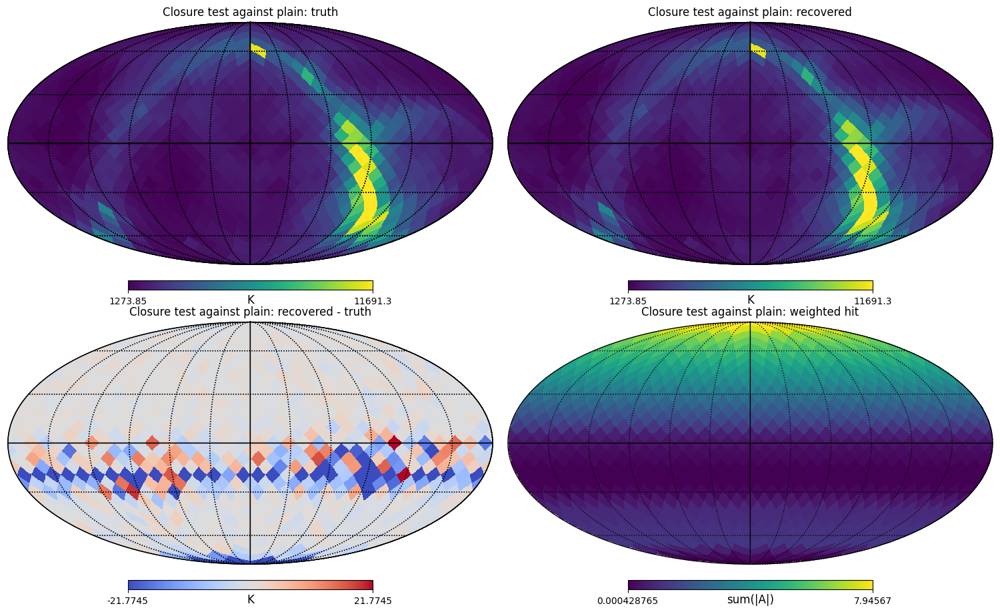

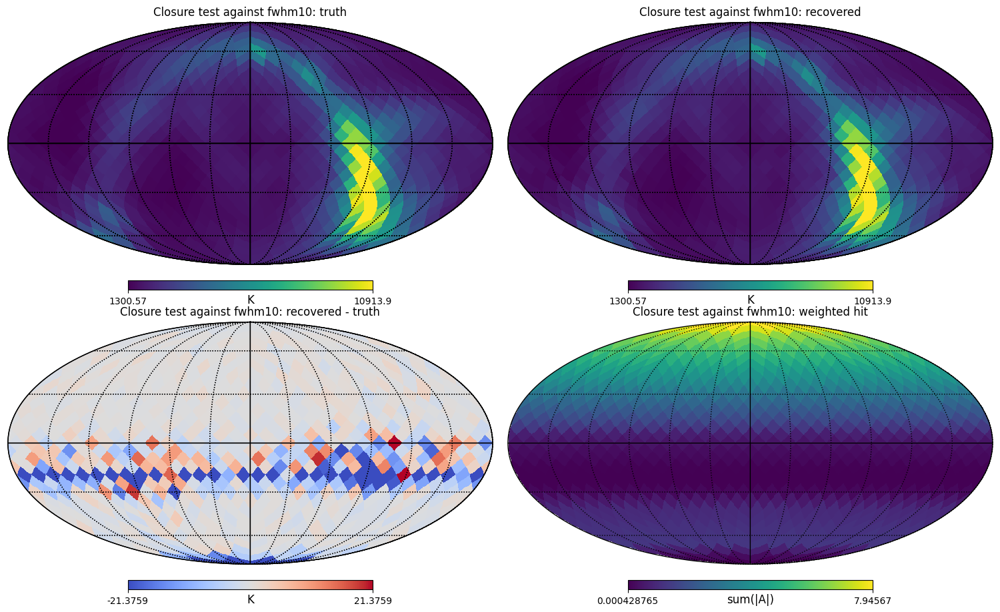

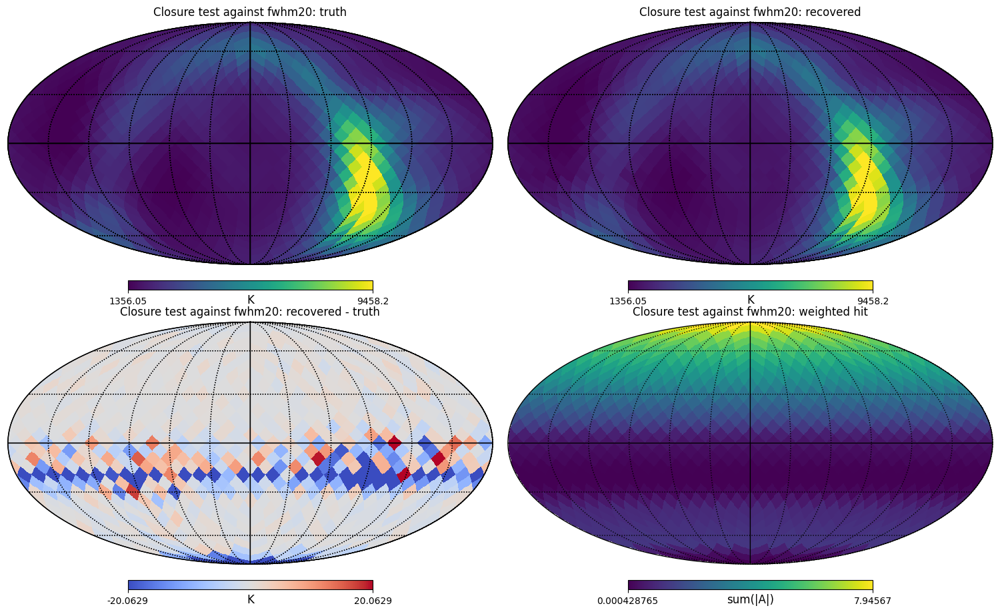

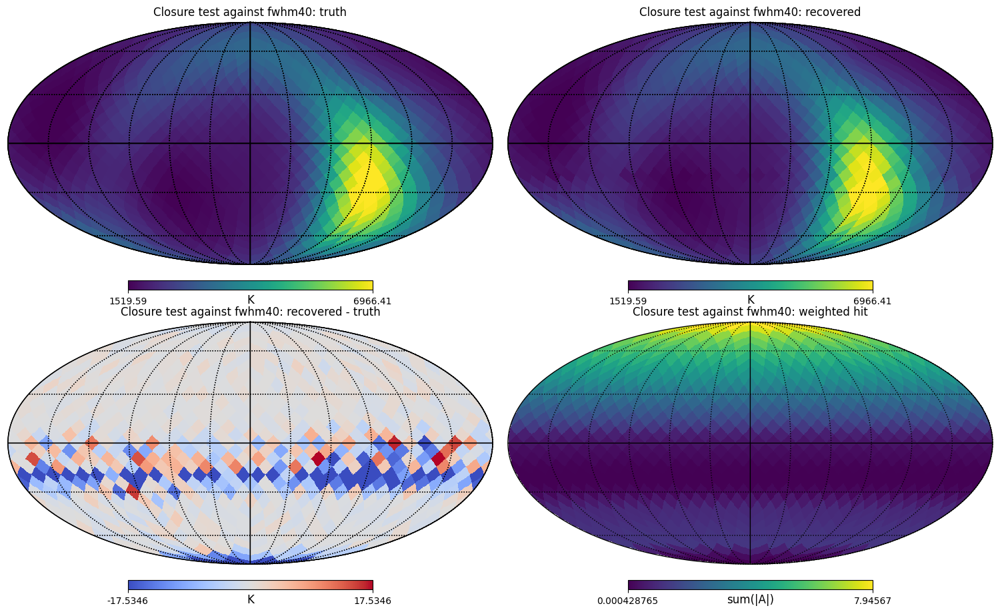

In [12]:

closure_rows = []
closure_results = {}
for ref_name, truth_patch in reference_patches.items():
    closure_tod = A @ truth_patch
    rec_closure, unc_closure = mapper(TOD_group=closure_tod, dtime=DT_SECONDS, noise_variance=NOISE_VARIANCE, regularization=REG_WEAK, use_high_pass=False)
    rec_closure = np.asarray(rec_closure).reshape(-1)
    closure_results[ref_name] = rec_closure
    closure_rows.append({"reference": ref_name, **map_metrics(rec_closure, truth_patch, weighted_hits_patch, cut=0.0)})
closure_df = pd.DataFrame(closure_rows)
display(closure_df)
for ref_name in ["plain", "fwhm10", "fwhm20", "fwhm40"]:
    plot_four_panel(reference_patches[ref_name], closure_results[ref_name], weighted_hits_patch, pix, title=f"Closure test against {ref_name}", nside=MAP_NSIDE, hit_label="sum(|A|)")


## 10. Generate actual high-NSIDE limTOD TOD

100%|██████████| 1440/1440 [00:01<00:00, 1038.05it/s]

actual_TOD                        : min/p1/p5/med/p95/p99/max = 1856 / 1868 / 1894 / 2895 / 3123 / 3147 / 3163


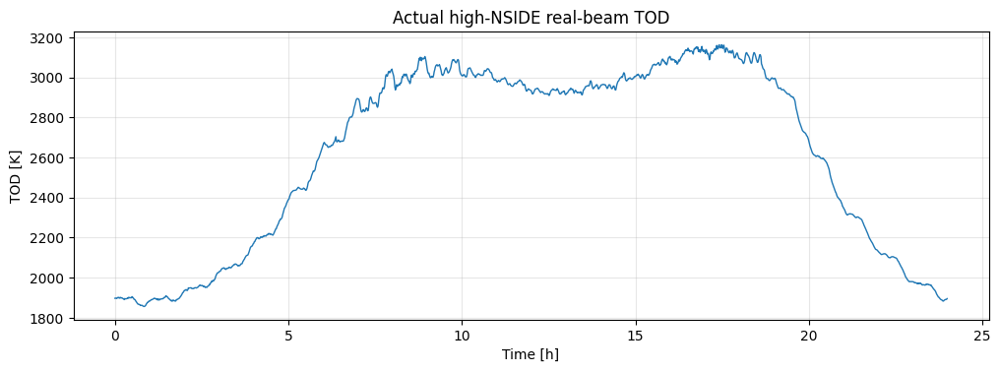

,reference,std(actual_TOD - A@ref)_K,relative_std_mismatch,corr_TOD_pred
0,plain,19.226856,0.042621,0.999134
1,fwhm10,22.849975,0.050652,0.999079
2,fwhm20,46.658304,0.103429,0.997640
3,fwhm40,135.946040,0.301357,0.978691


In [13]:

# sky_nside32 is already in ANALYSIS_COORD, matching the limTOD pointing/operator frame.
actual_TOD = generate_TOD_sky(
    beam_map=real_beam, sky_map=sky_nside32, LST_deg_list=LST_deg_list, lat_deg=ANT_LAT_DEG,
    azimuth_deg_list=azimuth_deg_list, elevation_deg_list=elevation_deg_list, selfrot_deg_list=selfrot_deg_list,
    nside_hires=SIM_NSIDE, normalize_beam=NORMALIZE_BEAM, truncate_frac_thres=BEAM_TRUNCATE_FRAC,
)
actual_TOD = np.asarray(actual_TOD, dtype=float).reshape(-1)
print_percentiles("actual_TOD", actual_TOD)
fig, ax = plt.subplots(figsize=(12, 3.8))
ax.plot(time_h, actual_TOD, lw=1.0)
ax.set_xlabel("Time [h]"); ax.set_ylabel("TOD [K]"); ax.set_title("Actual high-NSIDE real-beam TOD"); ax.grid(alpha=0.3); plt.show()

forward_rows = []
for ref_name, truth_patch in reference_patches.items():
    pred = A @ truth_patch
    diff = actual_TOD - pred
    forward_rows.append({"reference": ref_name, "std(actual_TOD - A@ref)_K": float(np.std(diff)), "relative_std_mismatch": float(np.std(diff)/np.std(actual_TOD)), "corr_TOD_pred": float(np.corrcoef(actual_TOD, pred)[0, 1])})
forward_df = pd.DataFrame(forward_rows)
display(forward_df)


## 11. Prior and regularisation scales

The solver is trying to fit

\[(A^T N^{-1} A + S^{-1} + \lambda I)m = A^T N^{-1}d + S^{-1}\mu\]

`regularization` is the generic diagonal stabiliser \(\lambda\). `Tsky_prior_mean` is \(\mu\). `Tsky_prior_inv_cov_diag` is \(S^{-1}=1/\sigma^2\). So `sigma_prior` is in K.

A relative prior like `0.5` means `sigma_prior[pixel] = max(0.5 * abs(prior_mean[pixel]), floor_K)`. It is a 50% uncertainty prior, not a 0.5 K prior.


In [14]:

AtA_diag = np.sum(A**2, axis=0) / NOISE_VARIANCE
print_percentiles("diag(A^T A)", AtA_diag)
print("\nRegularisation choices:")
print("  REG_WEAK  =", REG_WEAK)
print("  REG_RIDGE =", REG_RIDGE)
print("\nAbsolute sigma prior precisions:")
for sigma in ABSOLUTE_SIGMA_K_LIST:
    prior_precision = 1.0 / sigma**2
    print(f"  sigma={sigma:8.1f} K -> precision={prior_precision:.3e}, precision/REG_WEAK={prior_precision/REG_WEAK:.3e}, precision/REG_RIDGE={prior_precision/REG_RIDGE:.3e}")
prior_mean_for_scale = reference_patches[f"fwhm{int(REFERENCE_FOR_PRIOR)}"]
print("\nRelative prior sigma examples using the FWHM prior mean:")
for frac in RELATIVE_SIGMA_FRAC_LIST:
    sigma_pix = np.maximum(frac * np.abs(prior_mean_for_scale), RELATIVE_SIGMA_FLOOR_K)
    precision_pix = 1.0 / sigma_pix**2
    print(f"  frac={frac}: sigma pix percentiles [K] =", np.nanpercentile(sigma_pix, [0, 5, 50, 95, 100]))
    print(f"            precision percentiles =", np.nanpercentile(precision_pix, [0, 5, 50, 95, 100]))


diag(A^T A)                       : min/p1/p5/med/p95/p99/max = 1.838e-07 / 3.934e-07 / 1.023e-05 / 0.004252 / 0.03726 / 0.04371 / 0.04653

Regularisation choices:
  REG_WEAK  = 1e-08
  REG_RIDGE = 0.0001

Absolute sigma prior precisions:
  sigma=  5000.0 K -> precision=4.000e-08, precision/REG_WEAK=4.000e+00, precision/REG_RIDGE=4.000e-04
  sigma=  2000.0 K -> precision=2.500e-07, precision/REG_WEAK=2.500e+01, precision/REG_RIDGE=2.500e-03
  sigma=  1000.0 K -> precision=1.000e-06, precision/REG_WEAK=1.000e+02, precision/REG_RIDGE=1.000e-02
  sigma=   500.0 K -> precision=4.000e-06, precision/REG_WEAK=4.000e+02, precision/REG_RIDGE=4.000e-02
  sigma=   200.0 K -> precision=2.500e-05, precision/REG_WEAK=2.500e+03, precision/REG_RIDGE=2.500e-01
  sigma=   100.0 K -> precision=1.000e-04, precision/REG_WEAK=1.000e+04, precision/REG_RIDGE=1.000e+00

Relative prior sigma examples using the FWHM prior mean:
  frac=0.5: sigma pix percentiles [K] = [ 743.38922314  799.53745354 1164.77694922 28

## 12. Recover actual TOD: no prior, ridge, absolute priors, relative priors

In [15]:

prior_ref_key = f"fwhm{int(REFERENCE_FOR_PRIOR)}"
prior_mean = reference_patches[prior_ref_key].copy()
recovery_cases = {}

rec, unc = mapper(TOD_group=actual_TOD, dtime=DT_SECONDS, noise_variance=NOISE_VARIANCE, regularization=REG_WEAK, use_high_pass=False)
recovery_cases["no_prior_reg1e-8"] = {"map": np.asarray(rec).reshape(-1), "unc": np.asarray(unc).reshape(-1), "kind": "no_prior", "regularization": REG_WEAK}

rec, unc = mapper(TOD_group=actual_TOD, dtime=DT_SECONDS, noise_variance=NOISE_VARIANCE, regularization=REG_RIDGE, use_high_pass=False)
recovery_cases["no_prior_reg1e-4"] = {"map": np.asarray(rec).reshape(-1), "unc": np.asarray(unc).reshape(-1), "kind": "ridge_only", "regularization": REG_RIDGE}

for sigma_k in ABSOLUTE_SIGMA_K_LIST:
    prior_inv_cov_diag = np.ones_like(prior_mean) / sigma_k**2
    rec, unc = mapper(TOD_group=actual_TOD, dtime=DT_SECONDS, noise_variance=NOISE_VARIANCE, regularization=REG_WEAK, Tsky_prior_mean=prior_mean, Tsky_prior_inv_cov_diag=prior_inv_cov_diag, use_high_pass=False)
    recovery_cases[f"abs_prior_sigma{int(sigma_k)}K_reg1e-8"] = {"map": np.asarray(rec).reshape(-1), "unc": np.asarray(unc).reshape(-1), "kind": "absolute_prior", "regularization": REG_WEAK, "sigma_description": f"{sigma_k:.0f} K everywhere"}

for frac in RELATIVE_SIGMA_FRAC_LIST:
    sigma_pix = np.maximum(frac * np.abs(prior_mean), RELATIVE_SIGMA_FLOOR_K)
    prior_inv_cov_diag = 1.0 / sigma_pix**2
    rec, unc = mapper(TOD_group=actual_TOD, dtime=DT_SECONDS, noise_variance=NOISE_VARIANCE, regularization=REG_WEAK, Tsky_prior_mean=prior_mean, Tsky_prior_inv_cov_diag=prior_inv_cov_diag, use_high_pass=False)
    recovery_cases[f"rel_prior_{frac:.1f}_reg1e-8"] = {"map": np.asarray(rec).reshape(-1), "unc": np.asarray(unc).reshape(-1), "kind": "relative_prior", "regularization": REG_WEAK, "sigma_description": f"sigma_pix=max({frac}*prior_mean, {RELATIVE_SIGMA_FLOOR_K:.0f} K)", "sigma_pix": sigma_pix}

print("Recovery cases:")
for name, d in recovery_cases.items():
    print("-", name, "|", d.get("kind"), "| reg=", d.get("regularization"), "|", d.get("sigma_description", ""))
    print_percentiles("  recovered", d["map"])


Recovery cases:
- no_prior_reg1e-8 | no_prior | reg= 1e-08 | 
  recovered                       : min/p1/p5/med/p95/p99/max = -4.652e+04 / -1.735e+04 / -4284 / 2600 / 1.04e+04 / 2.149e+04 / 4.587e+04
- no_prior_reg1e-4 | ridge_only | reg= 0.0001 | 
  recovered                       : min/p1/p5/med/p95/p99/max = -1989 / -935 / -85.6 / 1925 / 4140 / 6244 / 8581
- abs_prior_sigma5000K_reg1e-8 | absolute_prior | reg= 1e-08 | 5000 K everywhere
  recovered                       : min/p1/p5/med/p95/p99/max = -3.784e+04 / -1.465e+04 / -4044 / 2590 / 1.02e+04 / 2.084e+04 / 3.943e+04
- abs_prior_sigma2000K_reg1e-8 | absolute_prior | reg= 1e-08 | 2000 K everywhere
  recovered                       : min/p1/p5/med/p95/p99/max = -1.889e+04 / -1.05e+04 / -3347 / 2564 / 8850 / 1.791e+04 / 2.434e+04
- abs_prior_sigma1000K_reg1e-8 | absolute_prior | reg= 1e-08 | 1000 K everywhere
  recovered                       : min/p1/p5/med/p95/p99/max = -1.477e+04 / -7508 / -1832 / 2583 / 7993 / 1.427e+04 / 1.946

## 13. Compare all recovery cases against all references

In [16]:

metric_rows = []
for case_name, case in recovery_cases.items():
    rec = case["map"]
    for ref_name, truth_patch in reference_patches.items():
        for cut in WEIGHTED_HIT_CUTS:
            metric_rows.append({"case": case_name, "kind": case.get("kind"), "regularization": case.get("regularization"), "reference": ref_name, "weighted_hit_cut": cut, **map_metrics(rec, truth_patch, weighted_hits_patch, cut=cut)})
metrics_df = pd.DataFrame(metric_rows)
focus_df = metrics_df[(metrics_df["reference"] == prior_ref_key) & (metrics_df["weighted_hit_cut"] == PLOT_HIT_CUT)].copy().sort_values("rmse")
display(focus_df)
display(metrics_df)


,case,kind,regularization,reference,weighted_hit_cut,n_pix,rmse,bias,std,corr
158,abs_prior_sigma100K_reg1e-8,absolute_prior,1.000000e-08,fwhm40,1.0,421,743.420716,-34.885553,742.601750,0.763481
138,abs_prior_sigma200K_reg1e-8,absolute_prior,1.000000e-08,fwhm40,1.0,421,852.022622,-48.631807,850.633585,0.683666
118,abs_prior_sigma500K_reg1e-8,absolute_prior,1.000000e-08,fwhm40,1.0,421,906.993504,-56.058245,905.259460,0.625544
98,abs_prior_sigma1000K_reg1e-8,absolute_prior,1.000000e-08,fwhm40,1.0,421,930.896542,-60.234704,928.945721,0.600395
198,rel_prior_0.3_reg1e-8,relative_prior,1.000000e-08,fwhm40,1.0,421,932.836507,-61.753217,930.790250,0.605161
178,rel_prior_0.5_reg1e-8,relative_prior,1.000000e-08,fwhm40,1.0,421,942.644224,-63.449909,940.506376,0.594075
78,abs_prior_sigma2000K_reg1e-8,absolute_prior,1.000000e-08,fwhm40,1.0,421,950.325279,-63.158029,948.224235,0.585483
58,abs_prior_sigma5000K_reg1e-8,absolute_prior,1.000000e-08,fwhm40,1.0,421,964.380305,-64.622687,962.212701,0.577359
18,no_prior_reg1e-8,no_prior,1.000000e-08,fwhm40,1.0,421,969.678203,-64.804447,967.510311,0.574792
38,no_prior_reg1e-4,ridge_only,1.000000e-04,fwhm40,1.0,421,979.173094,-61.227716,977.256934,0.592914


,case,kind,regularization,reference,weighted_hit_cut,n_pix,rmse,bias,std,corr
0,no_prior_reg1e-8,no_prior,1.000000e-08,plain,0.0,768,6313.313498,34.027778,6313.221795,0.101078
1,no_prior_reg1e-8,no_prior,1.000000e-08,plain,0.2,604,3134.753050,-31.867770,3134.591062,0.334887
2,no_prior_reg1e-8,no_prior,1.000000e-08,plain,0.5,532,1446.462448,-138.353345,1439.830534,0.594418
3,no_prior_reg1e-8,no_prior,1.000000e-08,plain,1.0,421,1189.781617,-102.290023,1185.376331,0.650669
4,no_prior_reg1e-8,no_prior,1.000000e-08,plain,2.0,272,870.570237,61.853938,868.370099,0.647176
...,...,...,...,...,...,...,...,...,...,...
195,rel_prior_0.3_reg1e-8,relative_prior,1.000000e-08,fwhm40,0.0,768,2825.563273,-82.621430,2824.355061,0.264899
196,rel_prior_0.3_reg1e-8,relative_prior,1.000000e-08,fwhm40,0.2,604,2208.242116,5.851189,2208.234364,0.398319
197,rel_prior_0.3_reg1e-8,relative_prior,1.000000e-08,fwhm40,0.5,532,1141.008859,-100.160888,1136.604158,0.551536
198,rel_prior_0.3_reg1e-8,relative_prior,1.000000e-08,fwhm40,1.0,421,932.836507,-61.753217,930.790250,0.605161


## 14. Plot key cases against the FWHM=40 reference

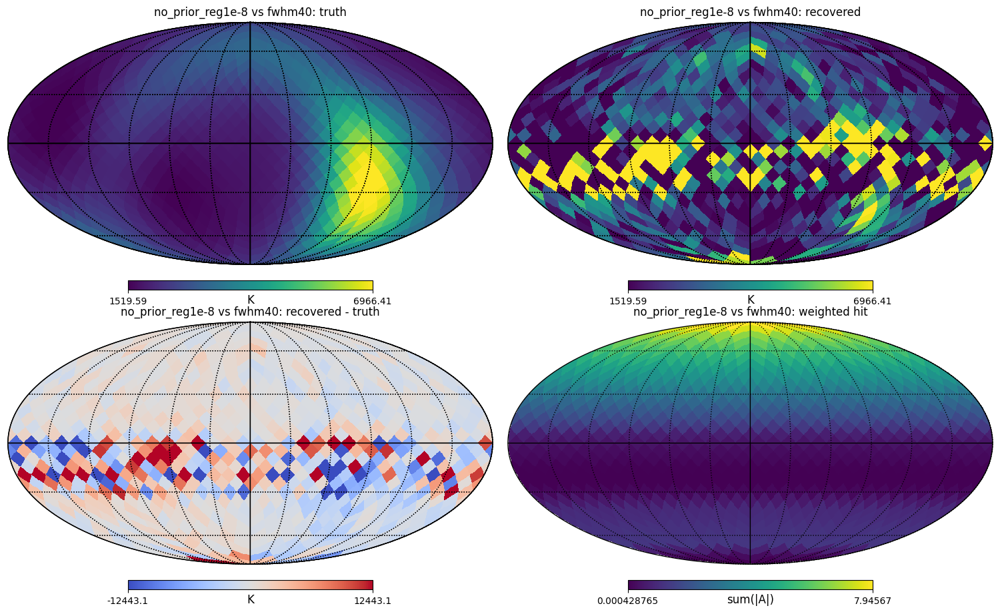

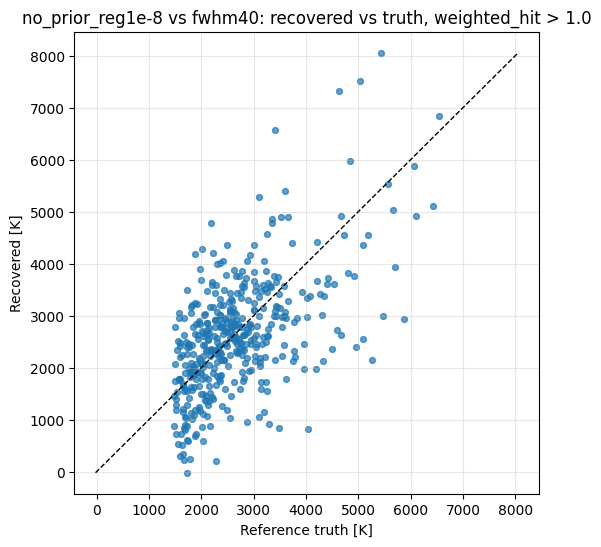

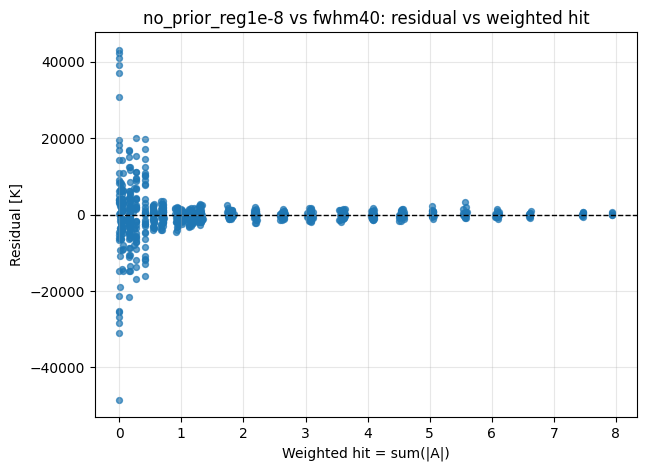

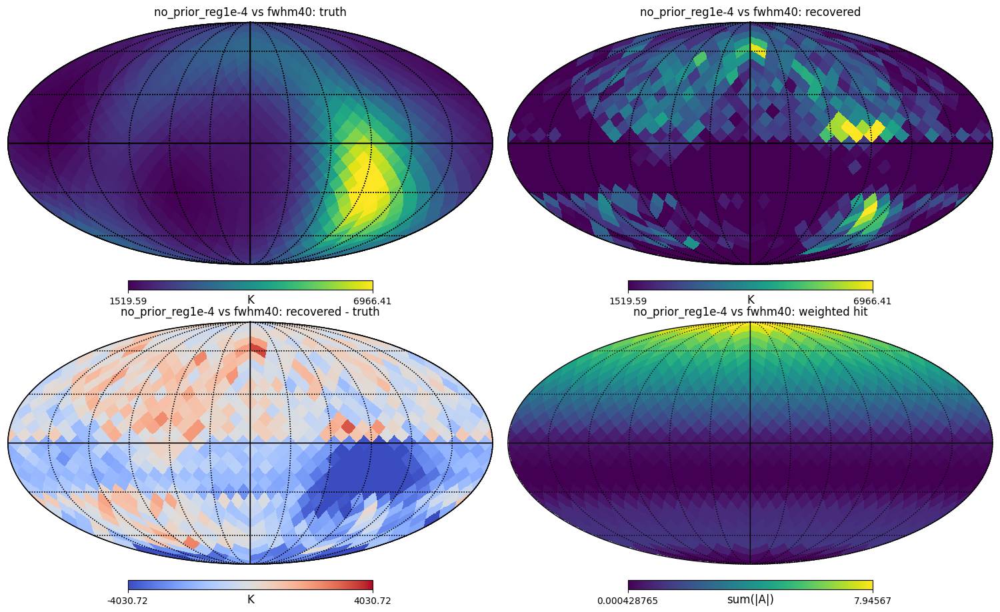

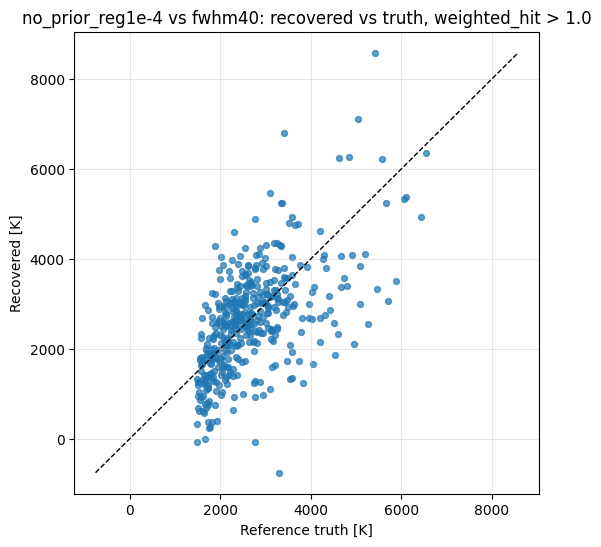

...

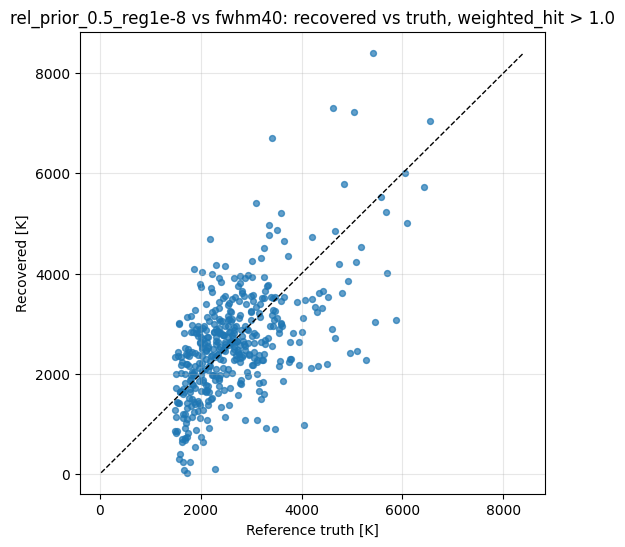

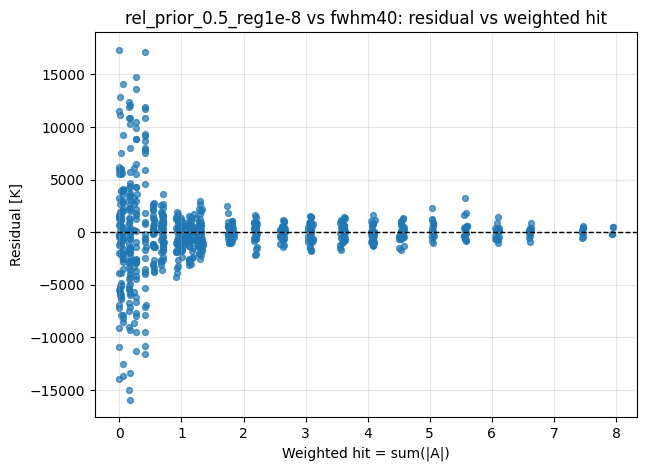

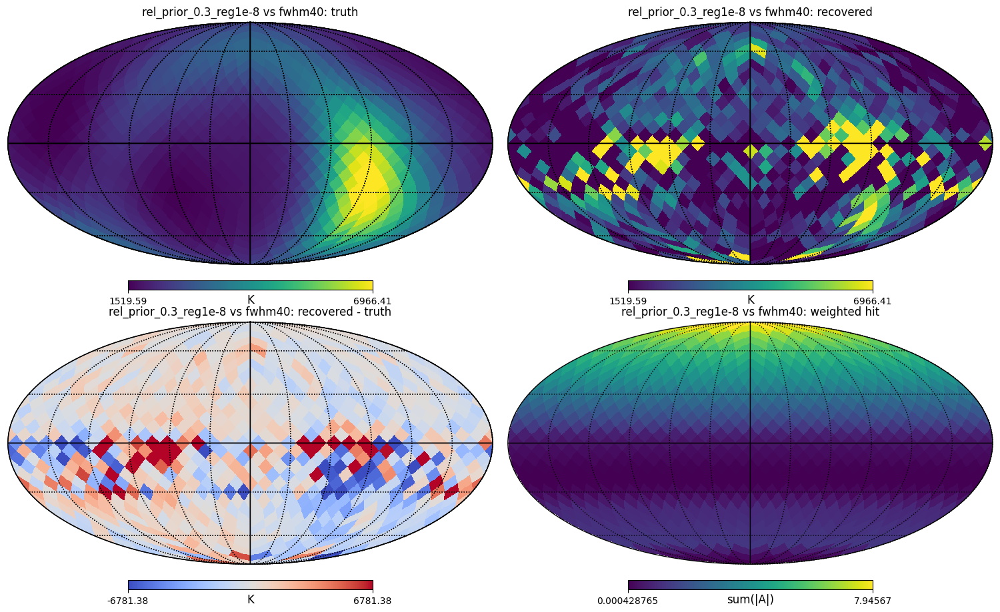

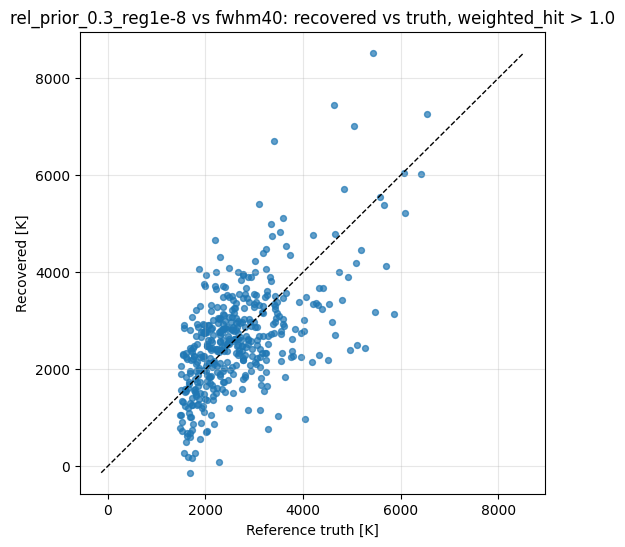

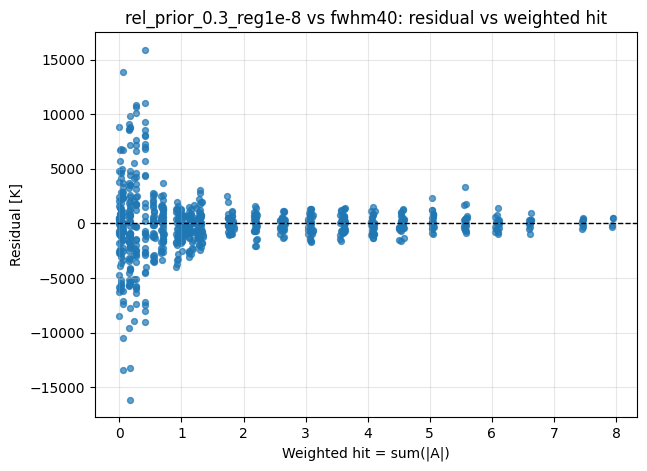

In [17]:

key_cases_to_plot = ["no_prior_reg1e-8", "no_prior_reg1e-4", "abs_prior_sigma2000K_reg1e-8", "abs_prior_sigma1000K_reg1e-8", "rel_prior_0.5_reg1e-8", "rel_prior_0.3_reg1e-8"]
truth_patch = reference_patches[prior_ref_key]
for case_name in key_cases_to_plot:
    if case_name not in recovery_cases:
        continue
    rec = recovery_cases[case_name]["map"]
    plot_four_panel(truth_patch, rec, weighted_hits_patch, pix, title=f"{case_name} vs {prior_ref_key}", nside=MAP_NSIDE, hit_label="sum(|A|)")
    plot_scatter_and_hit(rec, truth_patch, weighted_hits_patch, title=f"{case_name} vs {prior_ref_key}", hit_cut=PLOT_HIT_CUT)


## 15. Also compare key cases against plain degraded sky

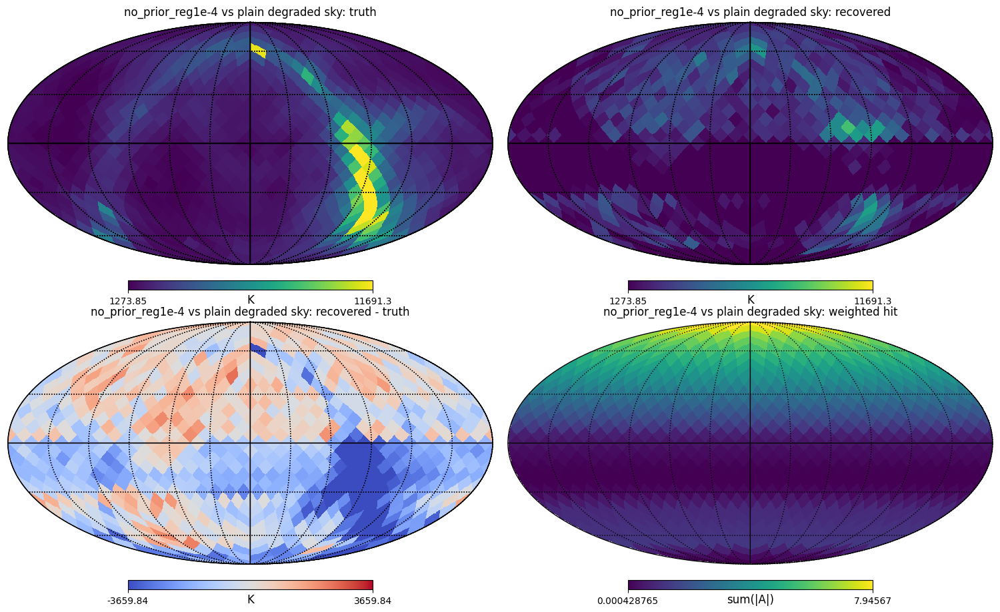

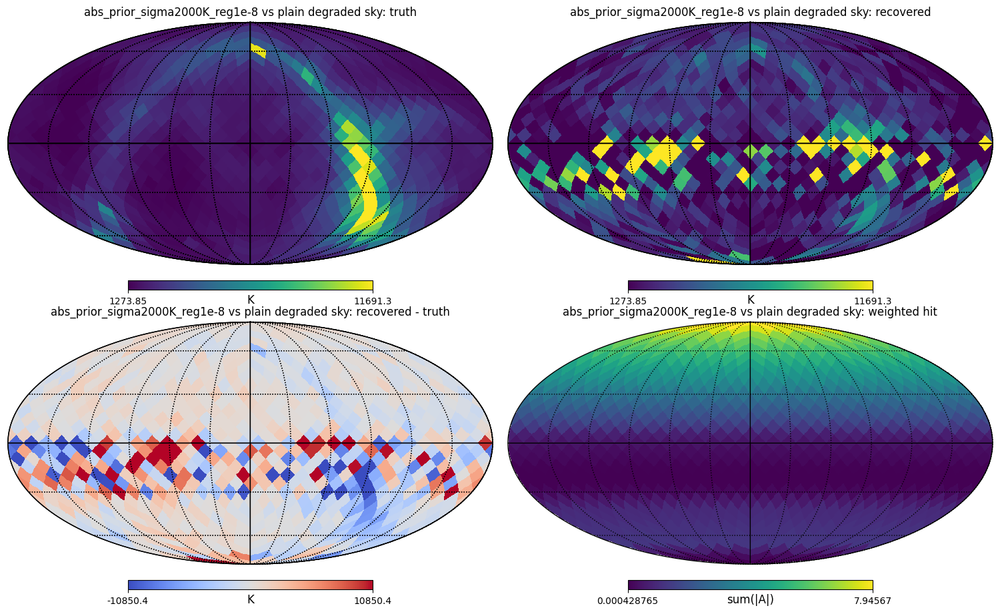

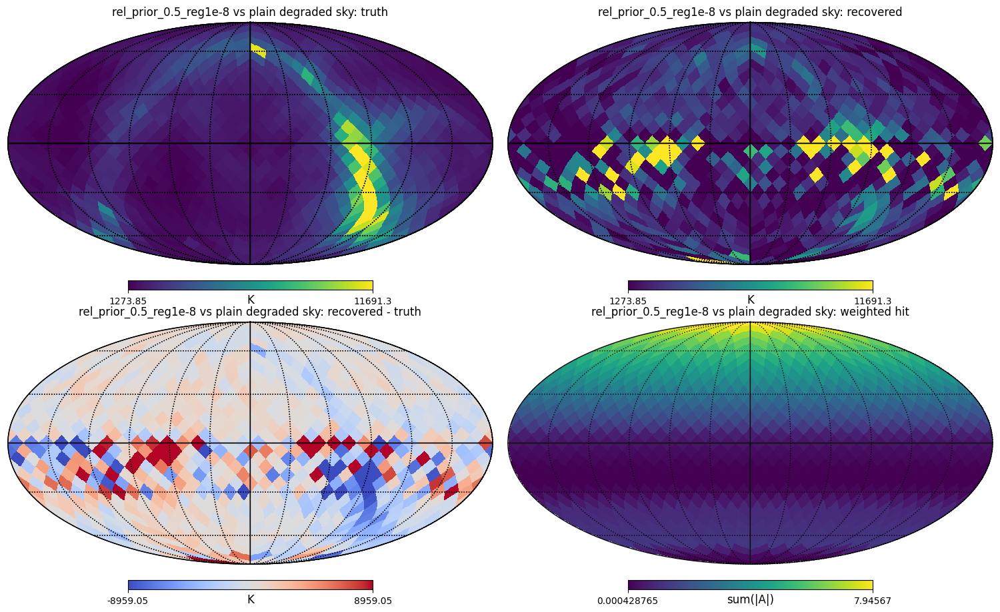

In [18]:

truth_patch_plain = reference_patches["plain"]
for case_name in ["no_prior_reg1e-4", "abs_prior_sigma2000K_reg1e-8", "rel_prior_0.5_reg1e-8"]:
    rec = recovery_cases[case_name]["map"]
    plot_four_panel(truth_patch_plain, rec, weighted_hits_patch, pix, title=f"{case_name} vs plain degraded sky", nside=MAP_NSIDE, hit_label="sum(|A|)")


## 16. Prior-strength summary plots

,case,sigma_K,n_pix,rmse,bias,std,corr
58,abs_prior_sigma5000K_reg1e-8,5000.0,421,964.380305,-64.622687,962.212701,0.577359
78,abs_prior_sigma2000K_reg1e-8,2000.0,421,950.325279,-63.158029,948.224235,0.585483
98,abs_prior_sigma1000K_reg1e-8,1000.0,421,930.896542,-60.234704,928.945721,0.600395
118,abs_prior_sigma500K_reg1e-8,500.0,421,906.993504,-56.058245,905.259460,0.625544
138,abs_prior_sigma200K_reg1e-8,200.0,421,852.022622,-48.631807,850.633585,0.683666
158,abs_prior_sigma100K_reg1e-8,100.0,421,743.420716,-34.885553,742.601750,0.763481


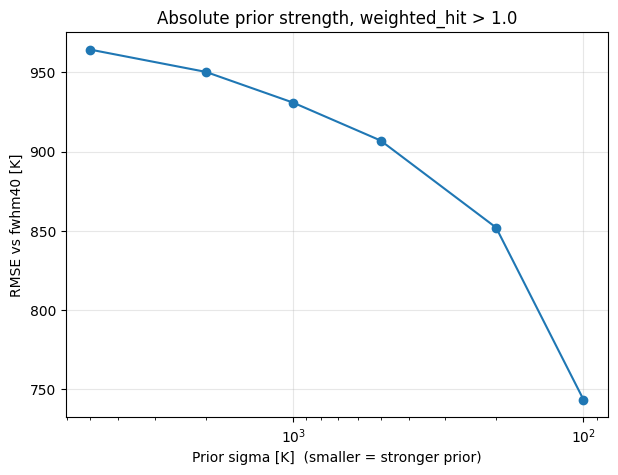

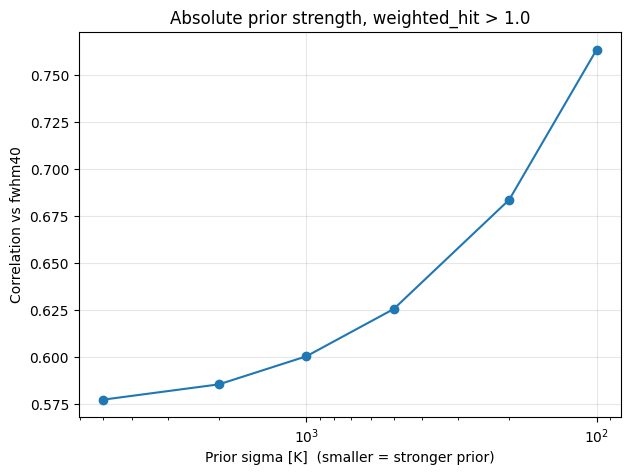

In [19]:

summary_for_plot = metrics_df[(metrics_df["reference"] == prior_ref_key) & (metrics_df["weighted_hit_cut"] == PLOT_HIT_CUT) & (metrics_df["kind"] == "absolute_prior")].copy()
def extract_sigma(case_name):
    m = re.search(r"sigma(\d+)K", case_name)
    return float(m.group(1)) if m else np.nan
summary_for_plot["sigma_K"] = summary_for_plot["case"].apply(extract_sigma)
summary_for_plot = summary_for_plot.sort_values("sigma_K", ascending=False)
display(summary_for_plot[["case", "sigma_K", "n_pix", "rmse", "bias", "std", "corr"]])
plt.figure(figsize=(7, 5))
plt.plot(summary_for_plot["sigma_K"], summary_for_plot["rmse"], marker="o")
plt.xscale("log"); plt.gca().invert_xaxis()
plt.xlabel("Prior sigma [K]  (smaller = stronger prior)"); plt.ylabel(f"RMSE vs {prior_ref_key} [K]")
plt.title(f"Absolute prior strength, weighted_hit > {PLOT_HIT_CUT}"); plt.grid(alpha=0.3); plt.show()
plt.figure(figsize=(7, 5))
plt.plot(summary_for_plot["sigma_K"], summary_for_plot["corr"], marker="o")
plt.xscale("log"); plt.gca().invert_xaxis()
plt.xlabel("Prior sigma [K]  (smaller = stronger prior)"); plt.ylabel(f"Correlation vs {prior_ref_key}")
plt.title(f"Absolute prior strength, weighted_hit > {PLOT_HIT_CUT}"); plt.grid(alpha=0.3); plt.show()


## 17. Interpretation notes printed by notebook

In [20]:

print("INTERPRETATION CHECKLIST")
print("1. The sky used for TOD, the reference maps, and the recovered maps are all in ANALYSIS_COORD =", ANALYSIS_COORD)
print("2. Grey pixels are not recovered values; they are outside mapper.pixel_indices.")
print("3. If closure tests are excellent, the operator/solver indexing is probably okay.")
print("4. If no_prior_reg1e-8 is unstable but no_prior_reg1e-4 is stable, weak modes are the problem.")
print("5. If priors improve low-hit regions, they are stabilising weak modes, not changing the TOD.")
print("6. If plain reference predicts the TOD better than Gaussian references, the real beam is not acting like that Gaussian smoothing scale.")
print("7. Quote metrics with weighted_hit cuts, especially weighted_hit >", PLOT_HIT_CUT)

best_focus = focus_df.iloc[0]
print("\nBest case in focus table against", prior_ref_key, "with weighted_hit >", PLOT_HIT_CUT)
print(best_focus)


INTERPRETATION CHECKLIST
1. The sky used for TOD, the reference maps, and the recovered maps are all in ANALYSIS_COORD = C
2. Grey pixels are not recovered values; they are outside mapper.pixel_indices.
3. If closure tests are excellent, the operator/solver indexing is probably okay.
4. If no_prior_reg1e-8 is unstable but no_prior_reg1e-4 is stable, weak modes are the problem.
5. If priors improve low-hit regions, they are stabilising weak modes, not changing the TOD.
6. If plain reference predicts the TOD better than Gaussian references, the real beam is not acting like that Gaussian smoothing scale.
7. Quote metrics with weighted_hit cuts, especially weighted_hit > 1.0

Best case in focus table against fwhm40 with weighted_hit > 1.0
case                abs_prior_sigma100K_reg1e-8
kind                             absolute_prior
regularization                              0.0
reference                                fwhm40
weighted_hit_cut                            1.0
n_pix          

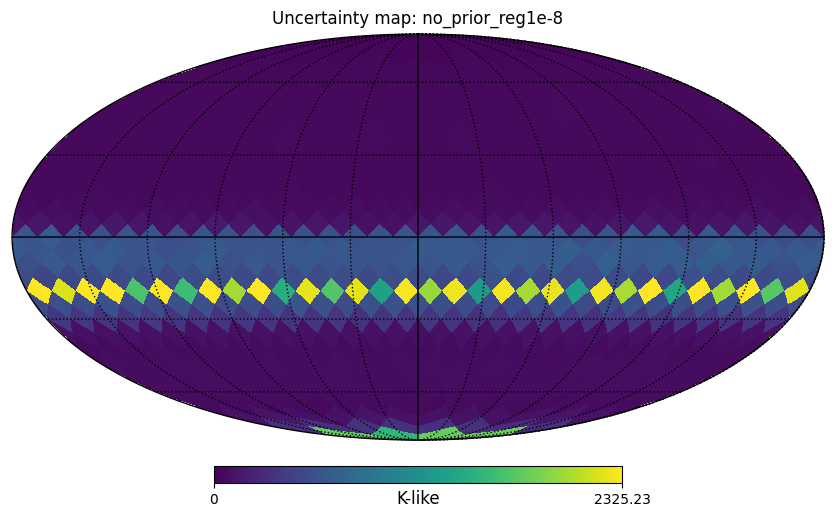


no_prior_reg1e-8
Uncertainty percentiles [0, 1, 5, 50, 95, 99, 100]:
[  29.42450888   35.62434601   51.23652746   77.71972923  699.21433356
 2325.23339487 3337.00565721]


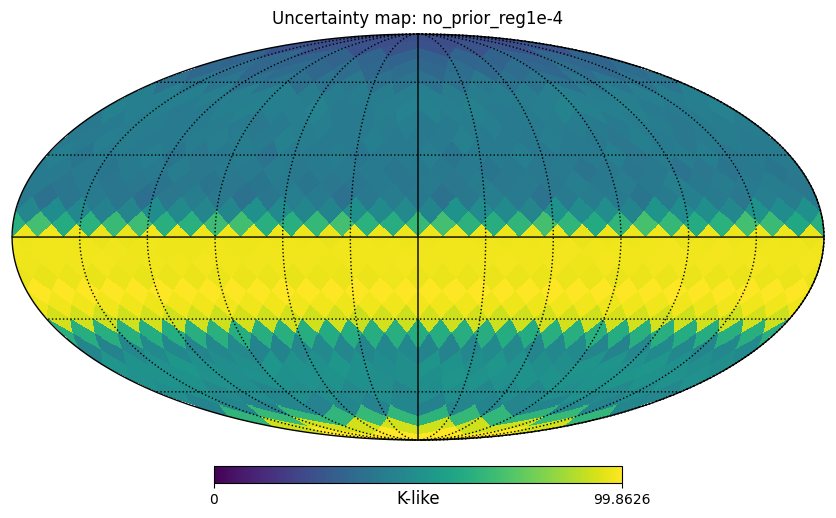


no_prior_reg1e-4
Uncertainty percentiles [0, 1, 5, 50, 95, 99, 100]:
[23.48477355 25.43599406 35.92087239 48.5192301  98.0808323  99.86263497
 99.9339584 ]


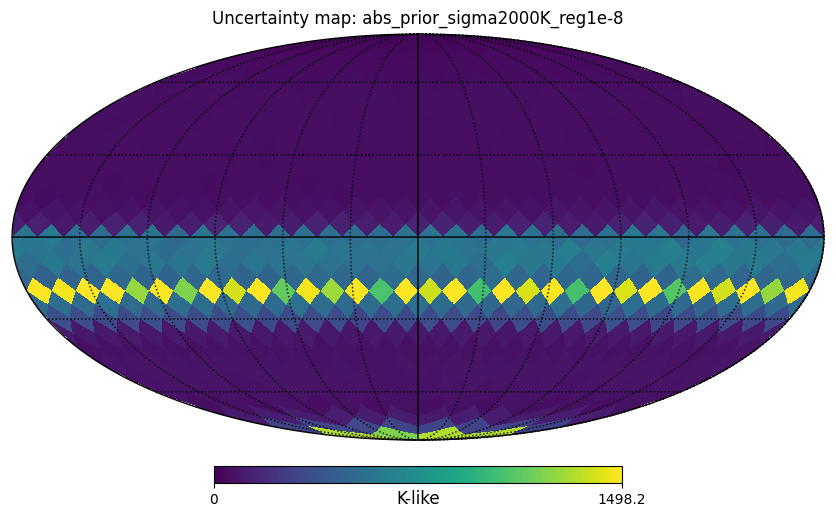


abs_prior_sigma2000K_reg1e-8
Uncertainty percentiles [0, 1, 5, 50, 95, 99, 100]:
[  28.81641329   34.54541934   50.00511801   75.5193764   640.00333118
 1498.19733427 1698.84257301]


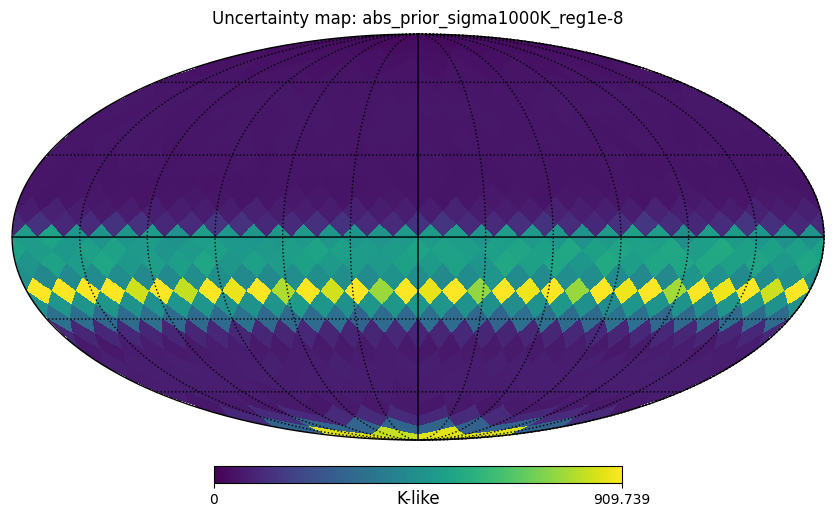


abs_prior_sigma1000K_reg1e-8
Uncertainty percentiles [0, 1, 5, 50, 95, 99, 100]:
[ 28.08921362  33.13917117  48.35431788  72.26684619 546.10873337
 909.73862079 951.35728252]


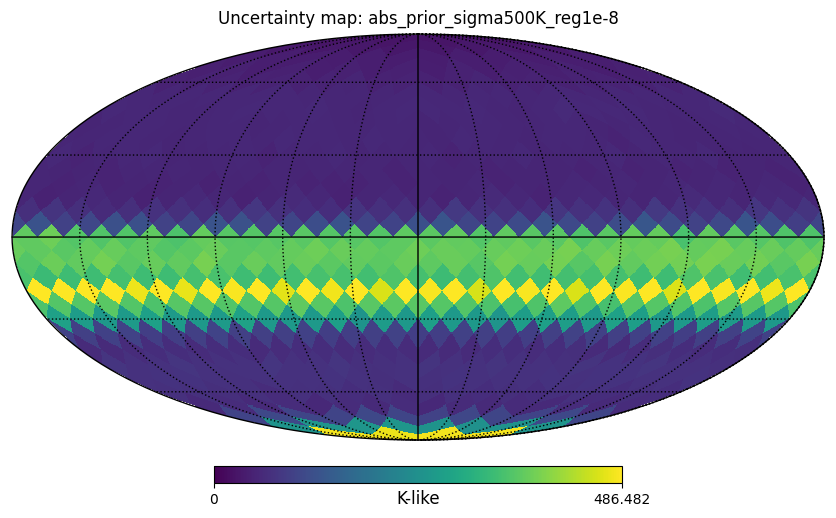


abs_prior_sigma500K_reg1e-8
Uncertainty percentiles [0, 1, 5, 50, 95, 99, 100]:
[ 27.01219391  31.13935179  45.66172481  67.29386915 387.11662208
 486.4815466  492.93030022]


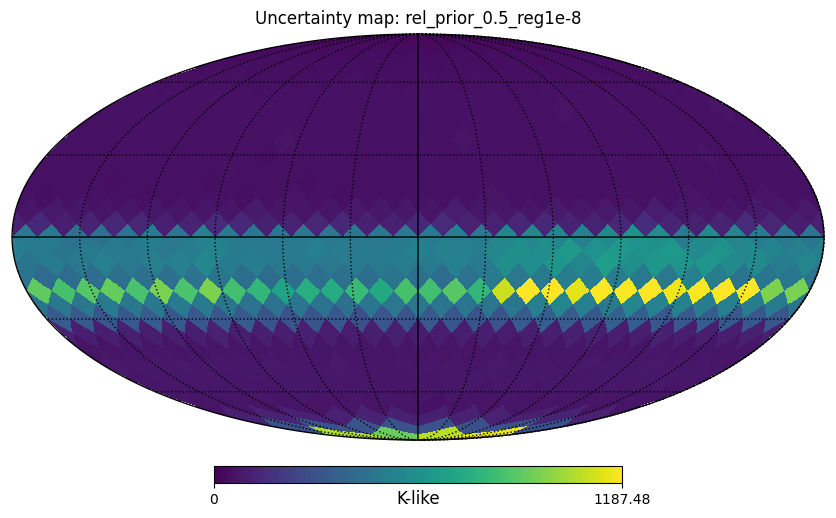


rel_prior_0.5_reg1e-8
Uncertainty percentiles [0, 1, 5, 50, 95, 99, 100]:
[  28.23223096   33.56746305   48.72452228   73.29806255  633.02540726
 1187.48458796 2118.20275768]


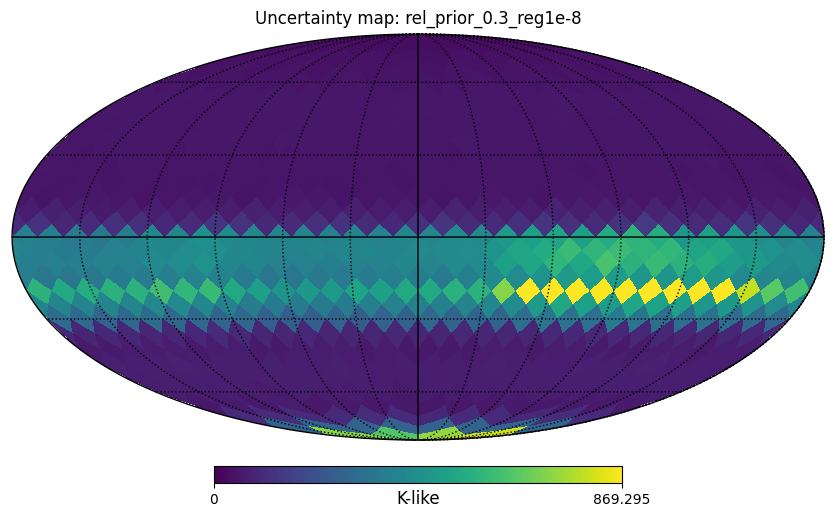


rel_prior_0.3_reg1e-8
Uncertainty percentiles [0, 1, 5, 50, 95, 99, 100]:
[  27.5122833    32.29656647   46.93260292   70.13580011  536.6930277
  869.29457429 1558.73273803]


In [21]:
# ============================================================
# PLOT UNCERTAINTY MAPS FROM EXISTING recovery_cases
# Uses the notebook's actual key: case["unc"]
# ============================================================

import numpy as np
import healpy as hp
import matplotlib.pyplot as plt

def patch_to_full_map(patch, pix, nside, fill=hp.UNSEEN):
    full = np.full(hp.nside2npix(nside), fill, dtype=float)
    full[np.asarray(pix)] = np.asarray(patch).reshape(-1)
    return full


def plot_uncertainty_map_from_case(case_name, case, pix, nside, percentile_max=99):
    if "unc" not in case:
        print(f"Skipping {case_name}: no `unc` stored.")
        return

    unc_patch = np.asarray(case["unc"]).reshape(-1)
    unc_full = patch_to_full_map(unc_patch, pix, nside)

    finite = np.isfinite(unc_patch)
    vmax = np.nanpercentile(unc_patch[finite], percentile_max)

    hp.mollview(
        unc_full,
        title=f"Uncertainty map: {case_name}",
        unit="K-like",
        min=0,
        max=vmax,
        badcolor="gray",
    )
    hp.graticule()
    plt.show()

    print(f"\n{case_name}")
    print("Uncertainty percentiles [0, 1, 5, 50, 95, 99, 100]:")
    print(np.nanpercentile(unc_patch[finite], [0, 1, 5, 50, 95, 99, 100]))


# ------------------------------------------------------------
# Plot uncertainty maps for selected cases
# ------------------------------------------------------------

cases_to_plot = [
    "no_prior_reg1e-8",
    "no_prior_reg1e-4",
    "abs_prior_sigma2000K_reg1e-8",
    "abs_prior_sigma1000K_reg1e-8",
    "abs_prior_sigma500K_reg1e-8",
    "rel_prior_0.5_reg1e-8",
    "rel_prior_0.3_reg1e-8",
]

for case_name in cases_to_plot:
    if case_name not in recovery_cases:
        print(f"Case not found: {case_name}")
        continue

    plot_uncertainty_map_from_case(
        case_name=case_name,
        case=recovery_cases[case_name],
        pix=pix,
        nside=MAP_NSIDE,
        percentile_max=99,
    )

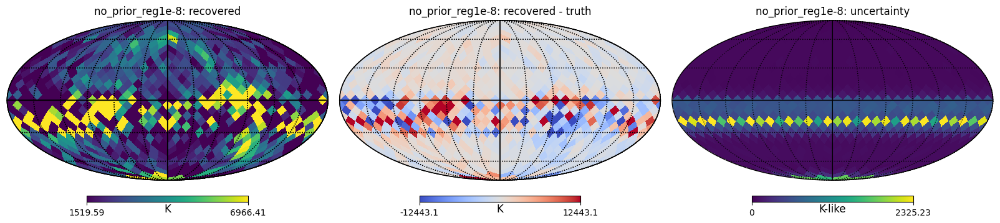


no_prior_reg1e-8
Recovered percentiles: [-17348.2549932   -4284.01286813   2600.00805428  10401.23250508
  21494.57296777]
Residual percentiles: [-19826.80405689  -6540.44351332    -23.82034565   8213.87491549
  19630.79290331]
Uncertainty percentiles: [  35.62434601   51.23652746   77.71972923  699.21433356 2325.23339487]


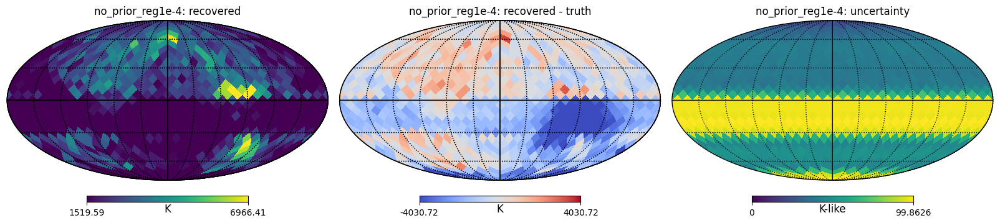


no_prior_reg1e-4
Recovered percentiles: [-934.97171469  -85.59703296 1924.96932205 4140.08867512 6243.62936225]
Residual percentiles: [-6027.06042866 -4030.7247669   -538.76176063  1240.7464128
  1999.90232625]
Uncertainty percentiles: [25.43599406 35.92087239 48.5192301  98.0808323  99.86263497]


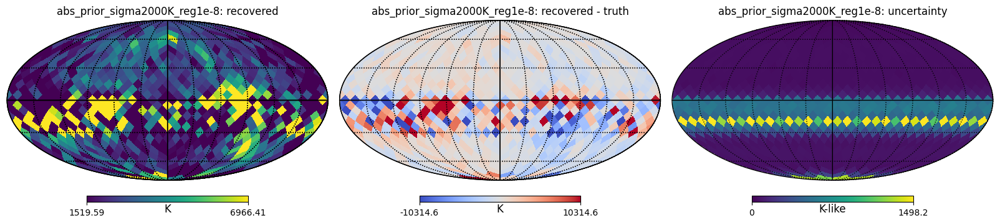


abs_prior_sigma2000K_reg1e-8
Recovered percentiles: [-10495.63811336  -3346.93386595   2564.02418283   8849.63763615
  17911.6686491 ]
Residual percentiles: [-12974.96419304  -6187.01292633    -32.33871857   6473.37582779
  15824.24837419]
Uncertainty percentiles: [  34.54541934   50.00511801   75.5193764   640.00333118 1498.19733427]


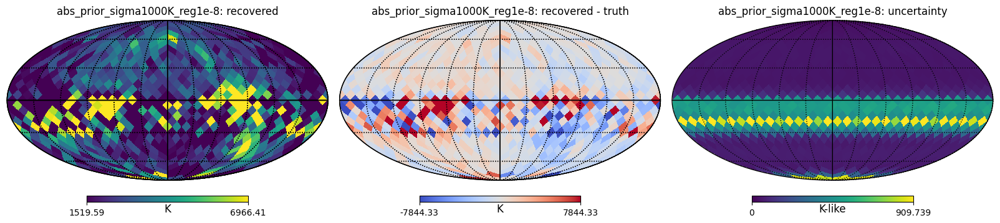


abs_prior_sigma1000K_reg1e-8
Recovered percentiles: [-7508.15127224 -1831.92347142  2583.41851065  7993.47613599
 14267.03084757]
Residual percentiles: [-9954.82827664 -4942.76291518   -25.46367798  5251.20725076
 11376.64401563]
Uncertainty percentiles: [ 33.13917117  48.35431788  72.26684619 546.10873337 909.73862079]


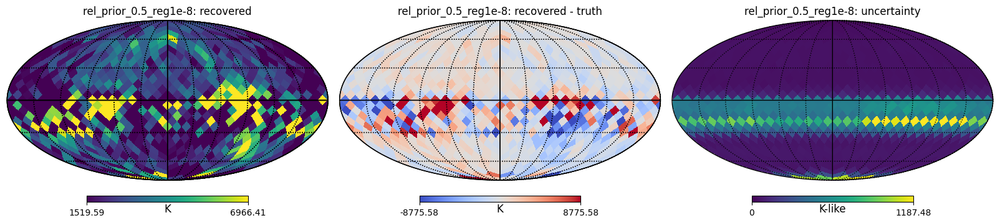


rel_prior_0.5_reg1e-8
Recovered percentiles: [-7663.00800154 -2672.92531249  2543.35682994  8193.27647569
 14686.20137283]
Residual percentiles: [-11002.36972752  -5725.12773279    -39.54767643   5592.13884788
  11983.36948998]
Uncertainty percentiles: [  33.56746305   48.72452228   73.29806255  633.02540726 1187.48458796]


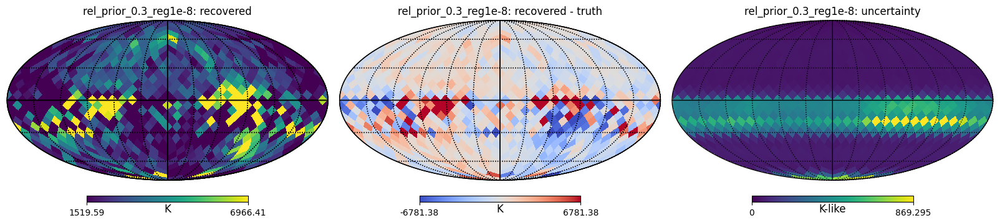


rel_prior_0.3_reg1e-8
Recovered percentiles: [-5526.41707296 -1174.51095168  2496.0581212   7459.69645579
 12252.12025727]
Residual percentiles: [-8191.64875546 -4532.62441278   -38.35607332  4317.30178663
  9199.76505476]
Uncertainty percentiles: [ 32.29656647  46.93260292  70.13580011 536.6930277  869.29457429]


In [22]:
# ============================================================
# RECOVERED / RESIDUAL / UNCERTAINTY SIDE BY SIDE
# Uses case["map"] and case["unc"]
# ============================================================

def plot_recovered_residual_uncertainty_case(
    case_name,
    truth_patch,
    recovery_cases,
    pix,
    nside,
    residual_percentile=95,
    uncertainty_percentile=99,
):
    case = recovery_cases[case_name]

    rec_patch = np.asarray(case["map"]).reshape(-1)
    unc_patch = np.asarray(case["unc"]).reshape(-1)
    truth_patch = np.asarray(truth_patch).reshape(-1)

    residual_patch = rec_patch - truth_patch

    rec_full = patch_to_full_map(rec_patch, pix, nside)
    res_full = patch_to_full_map(residual_patch, pix, nside)
    unc_full = patch_to_full_map(unc_patch, pix, nside)

    finite_truth = np.isfinite(truth_patch)
    vmin, vmax = np.nanpercentile(truth_patch[finite_truth], [1, 99])

    finite_res = np.isfinite(residual_patch)
    rmax = np.nanpercentile(np.abs(residual_patch[finite_res]), residual_percentile)

    finite_unc = np.isfinite(unc_patch)
    umax = np.nanpercentile(unc_patch[finite_unc], uncertainty_percentile)

    plt.figure(figsize=(16, 4.8))

    hp.mollview(
        rec_full,
        title=f"{case_name}: recovered",
        unit="K",
        min=vmin,
        max=vmax,
        sub=(1, 3, 1),
        badcolor="gray",
    )
    hp.graticule()

    hp.mollview(
        res_full,
        title=f"{case_name}: recovered - truth",
        unit="K",
        min=-rmax,
        max=rmax,
        cmap="coolwarm",
        sub=(1, 3, 2),
        badcolor="gray",
    )
    hp.graticule()

    hp.mollview(
        unc_full,
        title=f"{case_name}: uncertainty",
        unit="K-like",
        min=0,
        max=umax,
        sub=(1, 3, 3),
        badcolor="gray",
    )
    hp.graticule()

    plt.show()

    print(f"\n{case_name}")
    print("Recovered percentiles:", np.nanpercentile(rec_patch, [1, 5, 50, 95, 99]))
    print("Residual percentiles:", np.nanpercentile(residual_patch, [1, 5, 50, 95, 99]))
    print("Uncertainty percentiles:", np.nanpercentile(unc_patch, [1, 5, 50, 95, 99]))


# Compare against the prior reference truth, usually FWHM40
truth_patch = reference_patches[prior_ref_key]

for case_name in [
    "no_prior_reg1e-8",
    "no_prior_reg1e-4",
    "abs_prior_sigma2000K_reg1e-8",
    "abs_prior_sigma1000K_reg1e-8",
    "rel_prior_0.5_reg1e-8",
    "rel_prior_0.3_reg1e-8",
]:
    if case_name in recovery_cases:
        plot_recovered_residual_uncertainty_case(
            case_name=case_name,
            truth_patch=truth_patch,
            recovery_cases=recovery_cases,
            pix=pix,
            nside=MAP_NSIDE,
        )